<a href="https://colab.research.google.com/github/MyrtooS/Explainability-Methods-for-Brain-Tumor-Classification/blob/main/4_classes_MRI_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')
!ls '/content/drive'
folder='/content/drive/My Drive/MRI Classification/Brain Tumor Data Set'

Mounted at /content/drive
MyDrive


In [2]:
!pip install tf-explain
from tf_explain.core.smoothgrad import SmoothGrad

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 43 kB 1.5 MB/s 


In [3]:
import sys
sys.path.append('/content/drive/My Drive/MRI Classification/pyfiles')
import grad_cam
import ig_efficientnet
import smoothgrad
import lime
import effnet_preprocess
import multi_predict
import saliency
import gap_preprocess
import vgg_preprocess
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential,Model,load_model
import matplotlib.pyplot as plt

Φόρτωση εικόνων

In [ ]:
image_m = cv2.imread('/content/drive/My Drive/MRI Classification/mri_kaggle/Training/meningioma_tumor/m (39).jpg')
image_g = cv2.imread('/content/drive/My Drive/MRI Classification/mri_kaggle/Training/glioma_tumor/gg (35).jpg')
image_p = cv2.imread('/content/drive/My Drive/MRI Classification/mri_kaggle/Training/pituitary_tumor/p (42).jpg')
image = cv2.imread('/content/drive/My Drive/MRI Classification/mri_kaggle/Training/no_tumor/image (17).jpg')

image_m_1 = cv2.imread('/content/drive/My Drive/MRI Classification/mri_kaggle/Training/meningioma_tumor/m (119).jpg')
image_g_1 = cv2.imread('/content/drive/My Drive/MRI Classification/mri_kaggle/Training/glioma_tumor/gg (46).jpg')
image_p_1 = cv2.imread('/content/drive/My Drive/MRI Classification/mri_kaggle/Training/pituitary_tumor/p (112).jpg')
image_1 = cv2.imread('/content/drive/My Drive/MRI Classification/mri_kaggle/Training/no_tumor/image(17).jpg')

Ορισμός παραμέτρων για την μέθοδο Integrated Gradients

In [ ]:
baseline = tf.zeros(shape=(224,224,3))
m_steps=50
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1) 

EfficientNetB0

In [ ]:
eff_model = tf.keras.models.load_model('/content/drive/My Drive/MRI Classification/Multi_EfficientNet.h5')

Βοηθητικό μοντέλο

In [ ]:
y = eff_model.get_layer('dense_final').output
y = tf.math.scalar_mul(0.2, y)
y = layers.Activation("softmax")(y)

y_model = Model(inputs=eff_model.input, outputs=y)

Προεπεξεργασία και πρόβλεψη για το EfficientNetB0

In [ ]:
ima_m = effnet_preprocess.gradcam_preprocess(image_m)
ima_g = effnet_preprocess.gradcam_preprocess(image_g)
ima_p = effnet_preprocess.gradcam_preprocess(image_p)
ima_n = effnet_preprocess.gradcam_preprocess(image)
ima_m_1 = effnet_preprocess.gradcam_preprocess(image_m_1)
ima_g_1 = effnet_preprocess.gradcam_preprocess(image_g_1)
ima_p_1 = effnet_preprocess.gradcam_preprocess(image_p_1)
ima_n_1 = effnet_preprocess.gradcam_preprocess(image_1)

In [ ]:
m, im_m, model_m, ypred_m = multi_predict.predict_image_efficientnet(ima_m,y_model)
g, im_g, model_g,ypred_g = multi_predict.predict_image_efficientnet(ima_g,y_model)
p, im_p, model_p,ypred_p = multi_predict.predict_image_efficientnet(ima_p,y_model)
n, im_n, model_n,ypred_n = multi_predict.predict_image_efficientnet(ima_n,y_model)
m_1, im_m_1, model_m_1,ypred_m_1 = multi_predict.predict_image_efficientnet(ima_m_1,y_model)
g_1, im_g_1, model_g_1,ypred_g_1 = multi_predict.predict_image_efficientnet(ima_g_1,y_model)
p_1, im_p_1, model_p_1,ypred_p_1= multi_predict.predict_image_efficientnet(ima_p_1,y_model)
n_1, im_n_1, model_n_1,ypred_n_1 = multi_predict.predict_image_efficientnet(ima_n_1,y_model)

meningioma tumor
[[0.01536992 0.03901099 0.9406581  0.00496096]]
2
glioma tumor
[[0.00351406 0.90635234 0.02025591 0.06987767]]
1
pituitary tumor
[[0.7986765  0.03157363 0.13174158 0.03800828]]
0
no tumor
[[1.9543393e-06 8.9923051e-05 6.5015479e-06 9.9990153e-01]]
3
meningioma tumor
[[0.01646507 0.11762771 0.8580846  0.00782253]]
2
glioma tumor
[[0.00523347 0.9246434  0.03089865 0.03922456]]
1
pituitary tumor
[[0.9107716  0.03574045 0.02728367 0.0262043 ]]
0
no tumor
[[3.7722284e-08 8.9221311e-07 9.8812265e-08 9.9999893e-01]]
3


Μεθοδος GradCAM


In [ ]:
heatmap_m, output_m = grad_cam.make_gradcam(m,im_m,image_m,model_m,'top_activation')
heatmap_g, output_g = grad_cam.make_gradcam(g,im_g,image_g, model_g,'top_activation')
heatmap_p, output_p = grad_cam.make_gradcam(p,im_p,image_p, model_p,'top_activation')
heatmap_n, output_n = grad_cam.make_gradcam(n,im_n,image, model_n,'top_activation')


heatmap_m_1, output_m_1 = grad_cam.make_gradcam(m_1,im_m_1,image_m_1, model_m_1,'top_activation')
heatmap_g_1, output_g_1 = grad_cam.make_gradcam(g_1,im_g_1,image_g_1, model_g_1,'top_activation')
heatmap_p_1, output_p_1 = grad_cam.make_gradcam(p_1,im_p_1,image_p_1, model_p_1,'top_activation')
heatmap_n_1, output_n_1 = grad_cam.make_gradcam(n_1,im_n_1,image_1, model_n_1,'top_activation')

(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)


Μεθοδος Integrated Gradients

In [ ]:
img_m = effnet_preprocess.preprocess_ig(image_m)
img_m = effnet_preprocess.preprocess_ig(image_m)
img_g = effnet_preprocess.preprocess_ig(image_g)
img_p = effnet_preprocess.preprocess_ig(image_p)
img = effnet_preprocess.preprocess_ig(image)
img_m_1 = effnet_preprocess.preprocess_ig(image_m_1)
img_g_1 = effnet_preprocess.preprocess_ig(image_g_1)
img_p_1 = effnet_preprocess.preprocess_ig(image_p_1)
img_1 = effnet_preprocess.preprocess_ig(image_1)

In [ ]:
interpolated_images_m = ig_efficientnet.interpolate_images(baseline=baseline,image=img_m, alphas=alphas)
interpolated_images_g = ig_efficientnet.interpolate_images(baseline=baseline,image=img_g, alphas=alphas)
interpolated_images_p = ig_efficientnet.interpolate_images(baseline=baseline,image=img_p, alphas=alphas)
interpolated_images_n = ig_efficientnet.interpolate_images(baseline=baseline,image=img, alphas=alphas)
interpolated_images_m_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_m_1, alphas=alphas)
interpolated_images_g_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_g_1, alphas=alphas)
interpolated_images_p_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_p_1, alphas=alphas)
interpolated_images_n_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_1, alphas=alphas)


In [ ]:
path_gradients_m = ig_efficientnet.compute_gradients(images=interpolated_images_m, target_class_idx=m,model=y_model)
path_gradients_g = ig_efficientnet.compute_gradients(images=interpolated_images_g, target_class_idx=g,model=y_model)
path_gradients_p = ig_efficientnet.compute_gradients(images=interpolated_images_p, target_class_idx=p,model=y_model)
path_gradients_n = ig_efficientnet.compute_gradients(images=interpolated_images_n, target_class_idx=n,model=y_model)
path_gradients_m_1 = ig_efficientnet.compute_gradients(images=interpolated_images_m_1, target_class_idx=m_1,model=y_model)
path_gradients_g_1 = ig_efficientnet.compute_gradients(images=interpolated_images_g_1, target_class_idx=g_1,model=y_model)
path_gradients_p_1 = ig_efficientnet.compute_gradients(images=interpolated_images_p_1, target_class_idx=p_1,model=y_model)
path_gradients_n_1 = ig_efficientnet.compute_gradients(images=interpolated_images_n_1, target_class_idx=n_1,model=y_model)

In [ ]:
ig_m = ig_efficientnet.integral_approximation(gradients=path_gradients_m)
ig_g = ig_efficientnet.integral_approximation(gradients=path_gradients_g)
ig_p = ig_efficientnet.integral_approximation(gradients=path_gradients_p)
ig_n = ig_efficientnet.integral_approximation(gradients=path_gradients_n)
ig_m_1 = ig_efficientnet.integral_approximation(gradients=path_gradients_m_1)
ig_g_1 = ig_efficientnet.integral_approximation(gradients=path_gradients_g_1)
ig_p_1 = ig_efficientnet.integral_approximation(gradients=path_gradients_p_1)
ig_n_1 = ig_efficientnet.integral_approximation(gradients=path_gradients_n_1)



In [ ]:
_mig_attributions_m = ig_efficientnet.integrated_gradients(baseline=baseline,image=img_m,target_class_idx=m,model=y_model, m_steps=240)
_mig_attributions_g = ig_efficientnet.integrated_gradients(baseline=baseline,image=img_g,target_class_idx=g,model=y_model, m_steps=240)
_mig_attributions_p = ig_efficientnet.integrated_gradients(baseline=baseline,image=img_p,target_class_idx=p,model=y_model, m_steps=240)
_mig_attributions_n = ig_efficientnet.integrated_gradients(baseline=baseline,image=img,target_class_idx=n,model=y_model, m_steps=240)
_mig_attributions_m_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=img_m_1,target_class_idx=m_1,model=y_model, m_steps=240)
_mig_attributions_g_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=img_g_1,target_class_idx=g_1,model=y_model, m_steps=240)
_mig_attributions_p_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=img_p_1,target_class_idx=p_1,model=y_model, m_steps=240)
_mig_attributions_n_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=img_1,target_class_idx=n_1,model=y_model, m_steps=240)

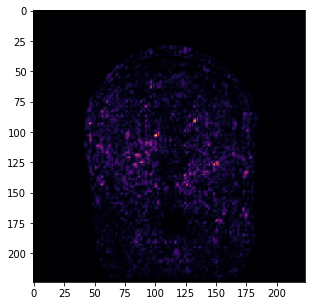

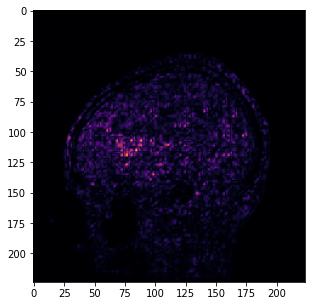

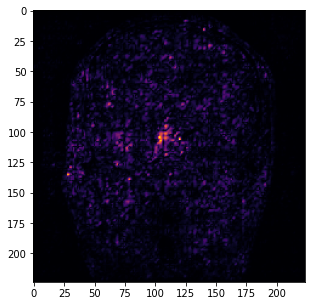

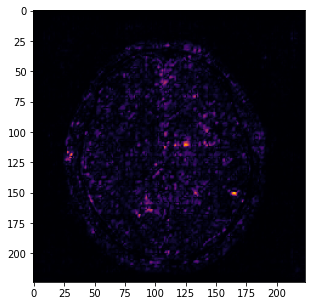

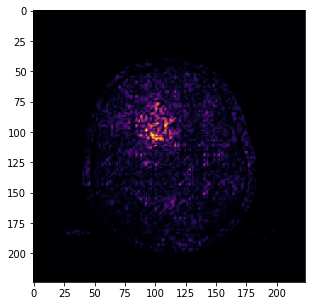

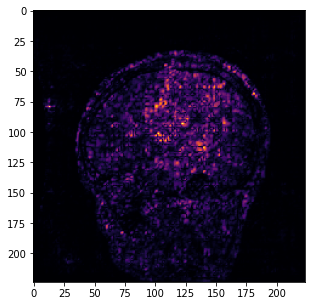

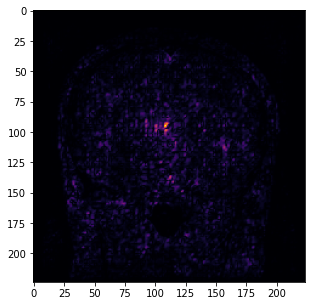

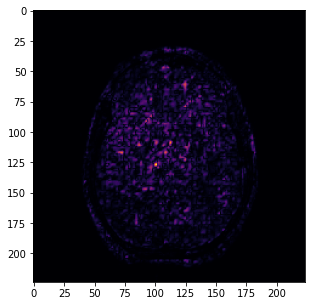

In [ ]:
att_m, plot_m = ig_efficientnet.plot(image=img_m, baseline=baseline, target_class_idx=m,model=y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_g, plot_g = ig_efficientnet.plot(image=img_g, baseline=baseline, target_class_idx=g,model=y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_p, plot_p = ig_efficientnet.plot(image=img_p, baseline=baseline, target_class_idx=p,model=y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_n, plot_n = ig_efficientnet.plot(image=img, baseline=baseline, target_class_idx=n,model=y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_m_1, plot_m_1 = ig_efficientnet.plot(image=img_m_1, baseline=baseline, target_class_idx=m_1,model=y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_g_1, plot_g_1 = ig_efficientnet.plot(image=img_g_1, baseline=baseline, target_class_idx=g_1,model=y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_p_1, plot_p_1 =  ig_efficientnet.plot(image=img_p_1, baseline=baseline, target_class_idx=p_1,model=y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_n_1, plot_n_1 = ig_efficientnet.plot(image=img_1, baseline=baseline, target_class_idx=n_1,model=y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)

Μεθοδος Saliency Maps

In [ ]:
simage_m = effnet_preprocess.preprocess_saliency(image_m)
simage_g = effnet_preprocess.preprocess_saliency(image_g)
simage_p = effnet_preprocess.preprocess_saliency(image_p)
simage_n = effnet_preprocess.preprocess_saliency(image)
simage_m_1 = effnet_preprocess.preprocess_saliency(image_m_1)
simage_g_1 = effnet_preprocess.preprocess_saliency(image_g_1)
simage_p_1 = effnet_preprocess.preprocess_saliency(image_p_1)
simage_n_1 = effnet_preprocess.preprocess_saliency(image_1)

In [ ]:
grads_m = saliency.saliency_preproccess(simage_m, y_model)
grads_g =  saliency.saliency_preproccess(simage_g, y_model)
grads_p =  saliency.saliency_preproccess(simage_p, y_model)
grads_n =  saliency.saliency_preproccess(simage_n, y_model)
grads_m_1 =  saliency.saliency_preproccess(simage_m_1, y_model)
grads_g_1 =  saliency.saliency_preproccess(simage_g_1, y_model)
grads_p_1 =  saliency.saliency_preproccess(simage_p_1, y_model)
grads_n_1 =  saliency.saliency_preproccess(simage_n_1, y_model)

In [ ]:
grad_eval_m = saliency.make_saliency(grads_m)
grad_eval_g = saliency.make_saliency(grads_g)
grad_eval_p = saliency.make_saliency(grads_p)
grad_eval_n = saliency.make_saliency(grads_n)
grad_eval_m_1 = saliency.make_saliency(grads_m_1)
grad_eval_g_1 = saliency.make_saliency(grads_g_1)
grad_eval_p_1 = saliency.make_saliency(grads_p_1)
grad_eval_n_1 = saliency.make_saliency(grads_n_1)

Μεθοδος Smoothgrad

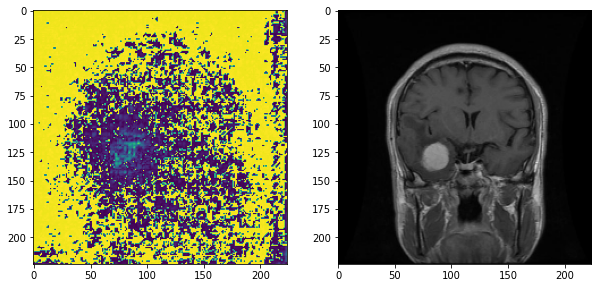

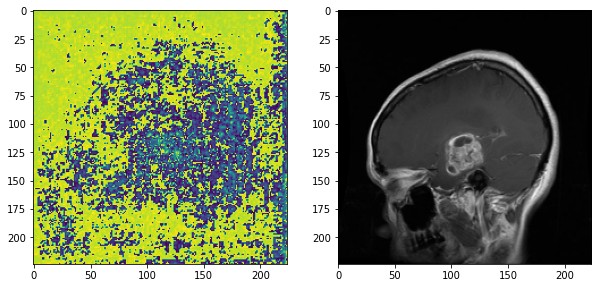

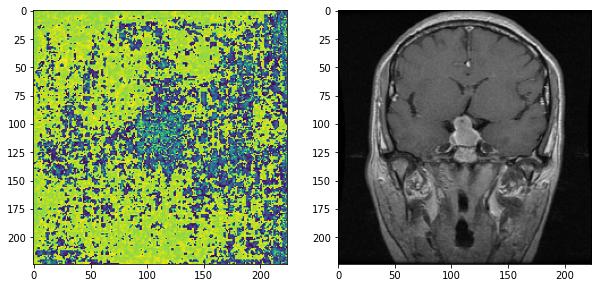

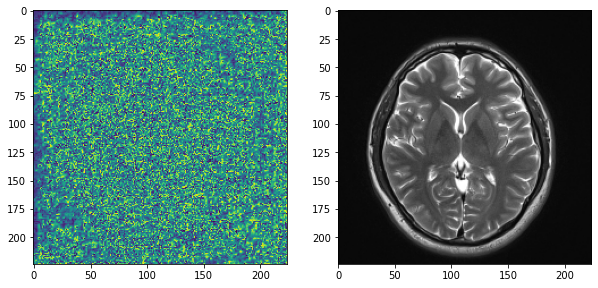

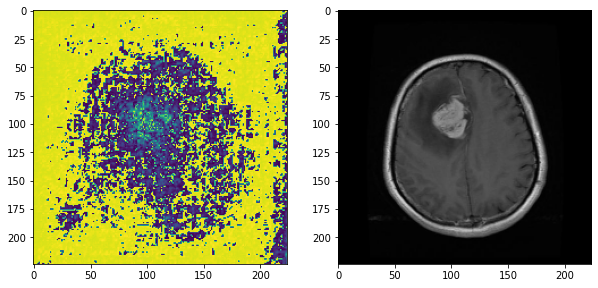

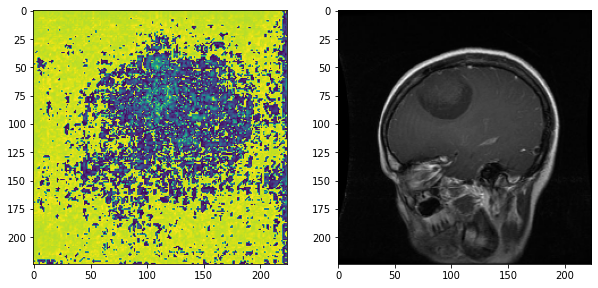

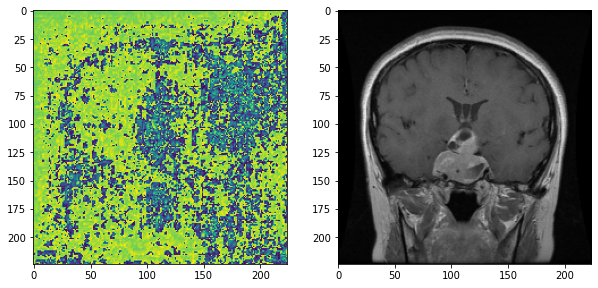

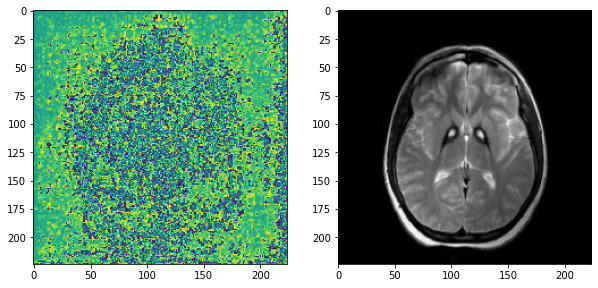

In [ ]:
grid_m = smoothgrad.smoothgrad(image_m, 2, y_model, 1)
grid_g = smoothgrad.smoothgrad(image_g, 1, y_model, 1)
grid_p = smoothgrad.smoothgrad(image_p, 0, y_model, 1)
grid_n = smoothgrad.smoothgrad(image, 3, y_model, 0.5)
grid_m_1 = smoothgrad.smoothgrad(image_m_1, 2, y_model, 1)
grid_g_1 = smoothgrad.smoothgrad(image_g_1, 1, y_model, 1)
grid_p_1 = smoothgrad.smoothgrad(image_p_1, 0, y_model, 1)
grid_n_1 = smoothgrad.smoothgrad(image_1, 3, y_model, 1)


Μεθοδος LIME

In [ ]:
top_features_m, num_superpixels_m, superpixels_m, img_m = lime.lime(image_m,y_model)
top_features_g, num_superpixels_g, superpixels_g,img_g = lime.lime(image_g,y_model)
top_features_p, num_superpixels_p, superpixels_p,img_p = lime.lime(image_p,y_model)
top_features_n, num_superpixels_n, superpixels_n,img_n = lime.lime(image,y_model)
top_features_m_1, num_superpixels_m_1, superpixels_m_1,img_m_1 = lime.lime(image_m_1,y_model)
top_features_g_1, num_superpixels_g_1, superpixels_g_1,img_g_1 = lime.lime(image_g_1,y_model)
top_features_p_1, num_superpixels_p_1, superpixels_p_1,img_p_1 =  lime.lime(image_p_1,y_model)
top_features_n_1, num_superpixels_n_1, superpixels_n_1,img_n_1 = lime.lime(image_1,y_model)


Αναπαράσταση των παραδειγμάτων για το EfficientNetB0

(-0.5, 223.5, 223.5, -0.5)

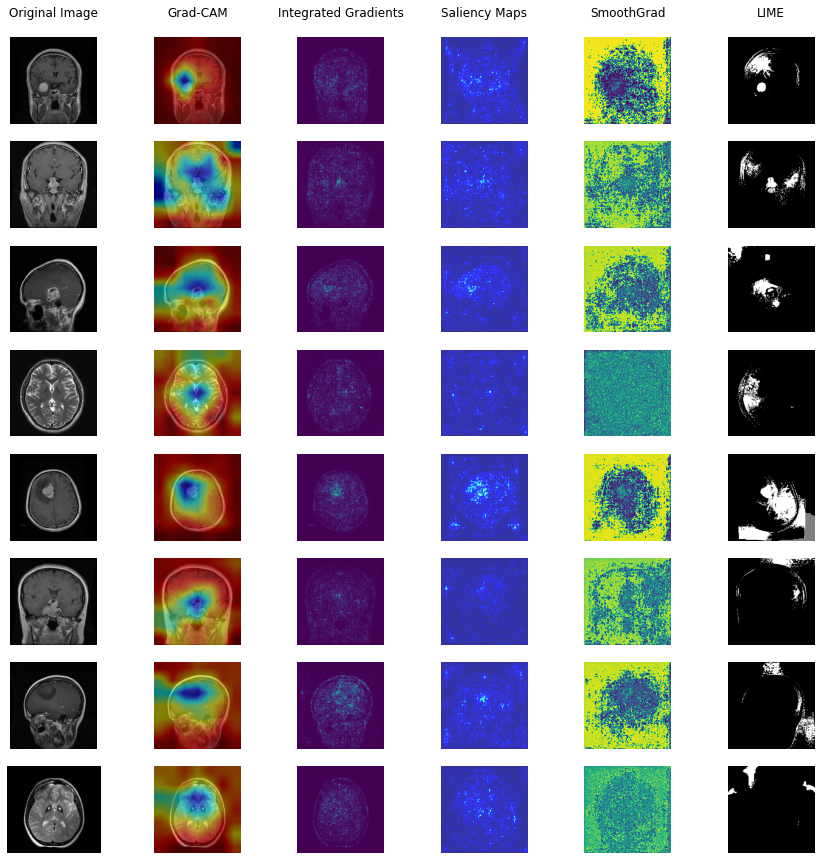

In [ ]:
fig, ax = plt.subplots(8,6,figsize=(15,15))

ax[0,0].set_title("Original Image\n")
ax[0,0].imshow(image_m)
ax[0,0].axis('off')
ax[0,0].set_ylabel("Meningioma")
# ax[0,0].set_title("Meningioma Tumor")
ax[1,0].imshow(image_p)
ax[1,0].axis('off')
ax[2,0].imshow(image_g)
ax[2,0].axis('off')
ax[3,0].imshow(image)
ax[3,0].axis('off')
ax[4,0].imshow(image_m_1)
ax[4,0].axis('off')
ax[5,0].imshow(image_p_1)
ax[5,0].axis('off')
ax[6,0].imshow(image_g_1)
ax[6,0].axis('off')
ax[7,0].imshow(image_1)
ax[7,0].axis('off')


ax[0,1].set_title("Grad-CAM\n")
ax[0,1].imshow(output_m)
ax[0,1].axis('off')
ax[1,1].imshow(output_p)
ax[1,1].axis('off')
ax[2,1].imshow(output_g)
ax[2,1].axis('off')
ax[3,1].imshow(output_n)
ax[3,1].axis('off')
ax[4,1].imshow(output_m_1)
ax[4,1].axis('off')
ax[5,1].imshow(output_p_1)
ax[5,1].axis('off')
ax[6,1].imshow(output_g_1)
ax[6,1].axis('off')
ax[7,1].imshow(output_n_1)
ax[7,1].axis('off')


ax[0,2].set_title("Integrated Gradients\n")
ax[0,2].imshow(plot_m)
ax[0,2].axis('off')
ax[1,2].imshow(plot_p)
ax[1,2].axis('off')
ax[2,2].imshow(plot_g)
ax[2,2].axis('off')
ax[3,2].imshow(plot_n)
ax[3,2].axis('off')
ax[4,2].imshow(plot_m_1)
ax[4,2].axis('off')
ax[5,2].imshow(plot_p_1)
ax[5,2].axis('off')
ax[6,2].imshow(plot_g_1)
ax[6,2].axis('off')
ax[7,2].imshow(plot_n_1)
ax[7,2].axis('off')

ax[0,3].set_title("Saliency Maps\n")
ax[0,3].imshow(grad_eval_m,cmap="jet",alpha=0.8)
ax[0,3].axis('off')
ax[1,3].imshow(grad_eval_p,cmap="jet",alpha=0.8)
ax[1,3].axis('off')
ax[2,3].imshow(grad_eval_g,cmap="jet",alpha=0.8)
ax[2,3].axis('off')
ax[3,3].imshow(grad_eval_n,cmap="jet",alpha=0.8)
ax[3,3].axis('off')
ax[4,3].imshow(grad_eval_m_1,cmap="jet",alpha=0.8)
ax[4,3].axis('off')
ax[5,3].imshow(grad_eval_g_1,cmap="jet",alpha=0.8)
ax[5,3].axis('off')
ax[6,3].imshow(grad_eval_p_1,cmap="jet",alpha=0.8)
ax[6,3].axis('off')
ax[7,3].imshow(grad_eval_n_1,cmap="jet",alpha=0.8)
ax[7,3].axis('off')

ax[0,4].set_title("SmoothGrad\n")
ax[0,4].imshow(grid_m)
ax[0,4].axis('off')
ax[1,4].imshow(grid_p)
ax[1,4].axis('off')
ax[2,4].imshow(grid_g)
ax[2,4].axis('off')
ax[3,4].imshow(grid_n)
ax[3,4].axis('off')
ax[4,4].imshow(grid_m_1)
ax[4,4].axis('off')
ax[5,4].imshow(grid_p_1)
ax[5,4].axis('off')
ax[6,4].imshow(grid_g_1)
ax[6,4].axis('off')
ax[7,4].imshow(grid_n_1)
ax[7,4].axis('off')

ax[0,5].set_title("LIME\n")
mask = np.zeros(num_superpixels_m) 
mask[top_features_m]= True #Activate top superpixels
ax[0,5].imshow(lime.perturb_image(img_m/2+0.5,mask,superpixels_m))
ax[0,5].axis('off')
mask = np.zeros(num_superpixels_p) 
mask[top_features_p]= True #Activate top superpixels
ax[1,5].imshow(lime.perturb_image(img_p/2+0.5,mask,superpixels_p))
ax[1,5].axis('off')
mask = np.zeros(num_superpixels_g) 
mask[top_features_g]= True #Activate top superpixels
ax[2,5].imshow(lime.perturb_image(img_p/2+0.5,mask,superpixels_g))
ax[2,5].axis('off')
mask = np.zeros(num_superpixels_n) 
mask[top_features_n]= True #Activate top superpixels
ax[3,5].imshow(lime.perturb_image(img_n/2+0.5,mask,superpixels_n))
ax[3,5].axis('off')
mask = np.zeros(num_superpixels_m_1) 
mask[top_features_m_1]= True #Activate top superpixels
ax[4,5].imshow(lime.perturb_image(img_m_1/2+0.5,mask,superpixels_m_1))
ax[4,5].axis('off')
amask = np.zeros(num_superpixels_p_1) 
mask[top_features_p_1]= True #Activate top superpixels
ax[5,5].imshow(lime.perturb_image(img_p_1/2+0.5,mask,superpixels_p_1))
ax[5,5].axis('off')
mask = np.zeros(num_superpixels_g_1) 
mask[top_features_g_1]= True #Activate top superpixels
ax[6,5].imshow(lime.perturb_image(img_g_1/2+0.5,mask,superpixels_g_1))
ax[6,5].axis('off')
mask = np.zeros(num_superpixels_n_1) 
mask[top_features_n_1]= True #Activate top superpixels
ax[7,5].imshow(lime.perturb_image(img_n_1/2+0.5,mask,superpixels_n_1))
ax[7,5].axis('off')

1o custom μοντέλο

In [ ]:
gap_model = tf.keras.models.load_model('/content/drive/My Drive/MRI Classification/gap_4.h5')

Προεπεξεργασία και πρόβλεψη για τις εικόνες

In [ ]:
gap_ima_m = gap_preprocess.gradcam_preprocess(image_m)
gap_ima_g = gap_preprocess.gradcam_preprocess(image_g)
gap_ima_p = gap_preprocess.gradcam_preprocess(image_p)
gap_ima_n = gap_preprocess.gradcam_preprocess(image)
gap_ima_m_1 = gap_preprocess.gradcam_preprocess(image_m_1)
gap_ima_g_1 = gap_preprocess.gradcam_preprocess(image_g_1)
gap_ima_p_1 = gap_preprocess.gradcam_preprocess(image_p_1)
gap_ima_n_1 = gap_preprocess.gradcam_preprocess(image_1)

In [ ]:
gap_m, gap_im_m, gap_model_m, pred_m = multi_predict.predict_image_efficientnet(gap_ima_m,gap_model)
gap_g, gap_im_g, gap_model_g,pred_g = multi_predict.predict_image_efficientnet(gap_ima_g,gap_model)
gap_p, gap_im_p, gap_model_p,pred_p = multi_predict.predict_image_efficientnet(gap_ima_p,gap_model)
gap_n, gap_im_n, gap_model_n,pred_n = multi_predict.predict_image_efficientnet(gap_ima_n,gap_model)

gap_m_1, gap_im_m_1, gap_model_m_1,pred_m_1 = multi_predict.predict_image_efficientnet(gap_ima_m_1,gap_model)
gap_g_1, gap_im_g_1, gap_model_g_1,pred_g_1 = multi_predict.predict_image_efficientnet(gap_ima_g_1,gap_model)
gap_p_1, gap_im_p_1, gap_model_p_1,pred_p_1= multi_predict.predict_image_efficientnet(gap_ima_p_1,gap_model)
gap_n_1, gap_im_n_1, gap_model_n_1,pred_n_1 = multi_predict.predict_image_efficientnet(gap_ima_n_1,gap_model)

meningioma tumor
[[4.4683466e-04 5.4787286e-04 9.9900371e-01 1.5352238e-06]]
2
glioma tumor
[[2.7126957e-06 9.9457800e-01 4.4714948e-03 9.4782811e-04]]
1
pituitary tumor
[[9.9999952e-01 1.6025474e-09 5.0786019e-07 2.9502795e-10]]
0
no tumor
[[9.7220132e-10 1.0593545e-06 4.8125298e-08 9.9999893e-01]]
3
meningioma tumor
[[1.8009270e-07 1.0590098e-06 9.9999869e-01 7.1710843e-08]]
2
glioma tumor
[[8.8302622e-05 9.6694350e-01 3.1998523e-02 9.6966483e-04]]
1
pituitary tumor
[[9.9807334e-01 8.4625717e-06 1.9179269e-03 2.6730373e-07]]
0
no tumor
[[8.5655125e-07 9.5894402e-06 1.3460926e-03 9.9864346e-01]]
3


Μέθοδος Grad-CAM

In [ ]:
gap_heatmap_m, gap_output_m = grad_cam.make_gradcam(gap_m,gap_im_m,image_m,gap_model_m,'conv2d_11')
gap_heatmap_g, gap_output_g = grad_cam.make_gradcam(gap_g,gap_im_g,image_g, gap_model_g,'conv2d_11')
gap_heatmap_p, gap_output_p = grad_cam.make_gradcam(gap_p,gap_im_p,image_p, gap_model_p,'conv2d_11')
gap_heatmap_n, gap_output_n = grad_cam.make_gradcam(gap_n,gap_im_n,image, gap_model_n,'conv2d_11')


gap_heatmap_m_1, gap_output_m_1 = grad_cam.make_gradcam(gap_m_1,gap_im_m_1,image_m_1, gap_model_m_1,'conv2d_11')
gap_heatmap_g_1, gap_output_g_1 = grad_cam.make_gradcam(gap_g_1,gap_im_g_1,image_g_1, gap_model_g_1,'conv2d_11')
gap_heatmap_p_1, gap_output_p_1 = grad_cam.make_gradcam(gap_p_1,gap_im_p_1,image_p_1, gap_model_p_1,'conv2d_11')
gap_heatmap_n_1, gap_output_n_1 = grad_cam.make_gradcam(gap_n_1,gap_im_n_1,image_1, gap_model_n_1,'conv2d_11')

(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)


Μέθοδος integrated gradients

In [ ]:
gap_img_m = effnet_preprocess.preprocess_ig(image_m)
gap_img_m = effnet_preprocess.preprocess_ig(image_m)
gap_img_g = effnet_preprocess.preprocess_ig(image_g)
gap_img_p = effnet_preprocess.preprocess_ig(image_p)
gap_img = effnet_preprocess.preprocess_ig(image)
gap_img_m_1 = effnet_preprocess.preprocess_ig(image_m_1)
gap_img_g_1 = effnet_preprocess.preprocess_ig(image_g_1)
gap_img_p_1 = effnet_preprocess.preprocess_ig(image_p_1)
gap_img_1 = effnet_preprocess.preprocess_ig(image_1)

In [ ]:
gap_interpolated_images_m = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_m, alphas=alphas)
gap_interpolated_images_g = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_g, alphas=alphas)
gap_interpolated_images_p = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_p, alphas=alphas)
gap_interpolated_images_n = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img, alphas=alphas)
gap_interpolated_images_m_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_m_1, alphas=alphas)
gap_interpolated_images_g_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_g_1, alphas=alphas)
gap_interpolated_images_p_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_p_1, alphas=alphas)
gap_interpolated_images_n_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_1, alphas=alphas)


In [ ]:
gap_path_gradients_m = ig_efficientnet.compute_gradients(images=gap_interpolated_images_m, target_class_idx=gap_m,model=gap_model)
gap_path_gradients_g = ig_efficientnet.compute_gradients(images=gap_interpolated_images_g, target_class_idx=gap_g,model=gap_model)
gap_path_gradients_p = ig_efficientnet.compute_gradients(images=gap_interpolated_images_p, target_class_idx=gap_p,model=gap_model)
gap_path_gradients_n = ig_efficientnet.compute_gradients(images=gap_interpolated_images_n, target_class_idx=gap_n,model=gap_model)
gap_path_gradients_m_1 = ig_efficientnet.compute_gradients(images=gap_interpolated_images_m_1, target_class_idx=gap_m_1,model=gap_model)
gap_path_gradients_g_1 = ig_efficientnet.compute_gradients(images=gap_interpolated_images_g_1, target_class_idx=gap_g_1,model=gap_model)
gap_path_gradients_p_1 = ig_efficientnet.compute_gradients(images=gap_interpolated_images_p_1, target_class_idx=gap_p_1,model=gap_model)
gap_path_gradients_n_1 = ig_efficientnet.compute_gradients(images=gap_interpolated_images_n_1, target_class_idx=gap_n_1,model=gap_model)

In [ ]:
gap_ig_m = ig_efficientnet.integral_approximation(gradients=gap_path_gradients_m)
gap_ig_g = ig_efficientnet.integral_approximation(gradients=gap_path_gradients_g)
gap_ig_p = ig_efficientnet.integral_approximation(gradients=gap_path_gradients_p)
gap_ig_n = ig_efficientnet.integral_approximation(gradients=gap_path_gradients_n)
gap_ig_m_1 = ig_efficientnet.integral_approximation(gradients=gap_path_gradients_m_1)
gap_ig_g_1 = ig_efficientnet.integral_approximation(gradients=gap_path_gradients_g_1)
gap_ig_p_1 = ig_efficientnet.integral_approximation(gradients=gap_path_gradients_p_1)
gap_ig_n_1 = ig_efficientnet.integral_approximation(gradients=gap_path_gradients_n_1)



In [ ]:
gap_mig_attributions_m = ig_efficientnet.integrated_gradients(baseline=baseline,image=gap_img_m,target_class_idx=gap_m,model=gap_model, m_steps=240)
gap_mig_attributions_g = ig_efficientnet.integrated_gradients(baseline=baseline,image=gap_img_g,target_class_idx=gap_g,model=gap_model, m_steps=240)
gap_mig_attributions_p = ig_efficientnet.integrated_gradients(baseline=baseline,image=gap_img_p,target_class_idx=gap_p,model=gap_model, m_steps=240)
gap_mig_attributions_n = ig_efficientnet.integrated_gradients(baseline=baseline,image=gap_img,target_class_idx=gap_n,model=gap_model, m_steps=240)
gap_mig_attributions_m_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=gap_img_m_1,target_class_idx=gap_m_1,model=gap_model, m_steps=240)
gap_mig_attributions_g_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=gap_img_g_1,target_class_idx=gap_g_1,model=gap_model, m_steps=240)
gap_mig_attributions_p_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=gap_img_p_1,target_class_idx=gap_p_1,model=gap_model, m_steps=240)
gap_mig_attributions_n_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=gap_img_1,target_class_idx=gap_n_1,model=gap_model, m_steps=240)

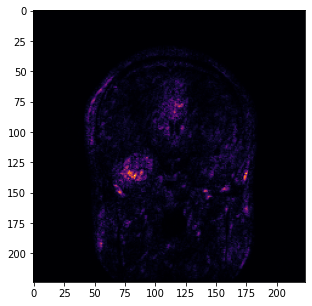

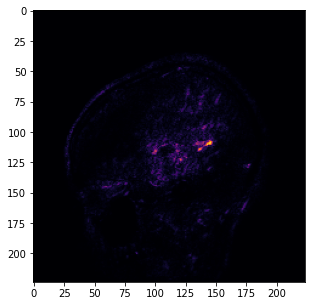

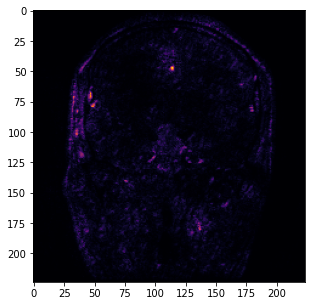

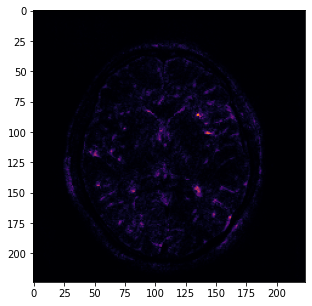

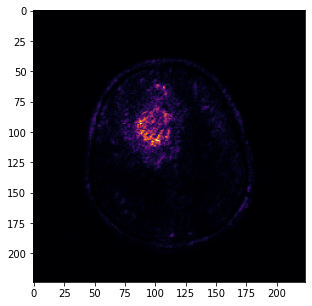

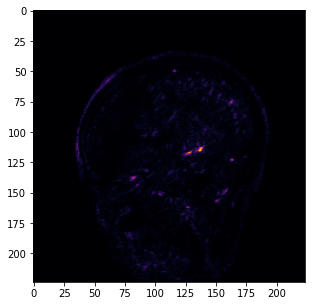

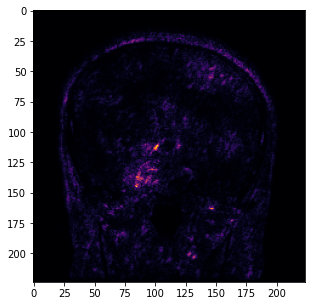

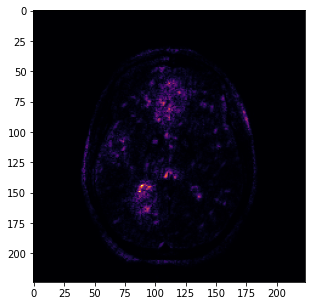

In [ ]:
gap_att_m, gap_plot_m = ig_efficientnet.plot(image=gap_img_m/255, baseline=baseline, target_class_idx=gap_m,model=gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_g, gap_plot_g = ig_efficientnet.plot(image=gap_img_g/255, baseline=baseline, target_class_idx=gap_g,model=gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_p, gap_plot_p = ig_efficientnet.plot(image=gap_img_p/255, baseline=baseline, target_class_idx=gap_p,model=gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_n, gap_plot_n = ig_efficientnet.plot(image=gap_img/255, baseline=baseline, target_class_idx=gap_n,model=gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_m_1, gap_plot_m_1 = ig_efficientnet.plot(image=gap_img_m_1/255, baseline=baseline, target_class_idx=gap_m_1,model=gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_g_1, gap_plot_g_1 = ig_efficientnet.plot(image=gap_img_g_1/255, baseline=baseline, target_class_idx=gap_g_1,model=gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_p_1, gap_plot_p_1 =  ig_efficientnet.plot(image=gap_img_p_1/255, baseline=baseline, target_class_idx=gap_p_1,model=gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_n_1, gap_plot_n_1 = ig_efficientnet.plot(image=gap_img_1/255, baseline=baseline, target_class_idx=gap_n_1,model=gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)

Μέθοδος Saliency Maps


In [ ]:
gap_simage_m = gap_preprocess.preprocess_saliency(image_m)
gap_simage_g = gap_preprocess.preprocess_saliency(image_g)
gap_simage_p = gap_preprocess.preprocess_saliency(image_p)
gap_simage_n = gap_preprocess.preprocess_saliency(image)
gap_simage_m_1 = gap_preprocess.preprocess_saliency(image_m_1)
gap_simage_g_1 = gap_preprocess.preprocess_saliency(image_g_1)
gap_simage_p_1 = gap_preprocess.preprocess_saliency(image_p_1)
gap_simage_n_1 = gap_preprocess.preprocess_saliency(image_1)

In [ ]:
gap_grads_m = saliency.saliency_preproccess(gap_simage_m, gap_model)
gap_grads_g =  saliency.saliency_preproccess(gap_simage_g, gap_model)
gap_grads_p =  saliency.saliency_preproccess(gap_simage_p, gap_model)
gap_grads_n =  saliency.saliency_preproccess(gap_simage_n, gap_model)
gap_grads_m_1 =  saliency.saliency_preproccess(gap_simage_m_1, gap_model)
gap_grads_g_1 =  saliency.saliency_preproccess(gap_simage_g_1, gap_model)
gap_grads_p_1 =  saliency.saliency_preproccess(gap_simage_p_1, gap_model)
gap_grads_n_1 =  saliency.saliency_preproccess(gap_simage_n_1, gap_model)

In [ ]:
gap_grad_eval_m = saliency.make_saliency(gap_grads_m)
gap_grad_eval_g = saliency.make_saliency(gap_grads_g)
gap_grad_eval_p = saliency.make_saliency(gap_grads_p)
gap_grad_eval_n = saliency.make_saliency(gap_grads_n)
gap_grad_eval_m_1 = saliency.make_saliency(gap_grads_m_1)
gap_grad_eval_g_1 = saliency.make_saliency(gap_grads_g_1)
gap_grad_eval_p_1 = saliency.make_saliency(gap_grads_p_1)
gap_grad_eval_n_1 = saliency.make_saliency(gap_grads_n_1)

Μέθοδος Smoothgrad

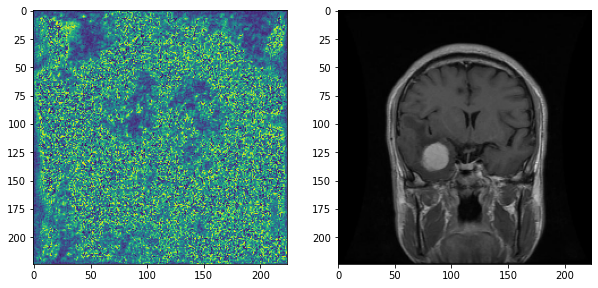

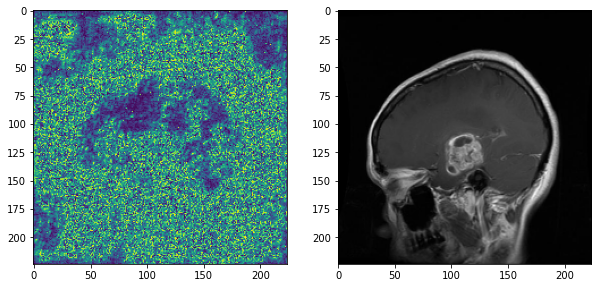

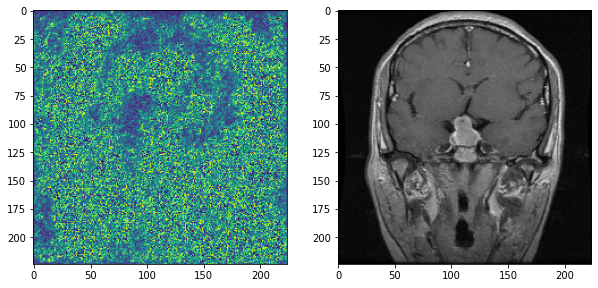

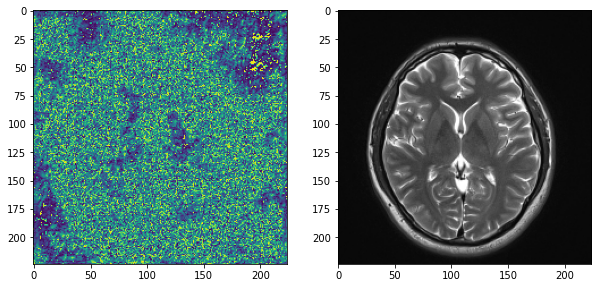

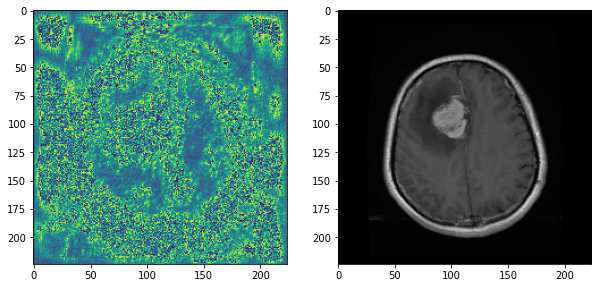

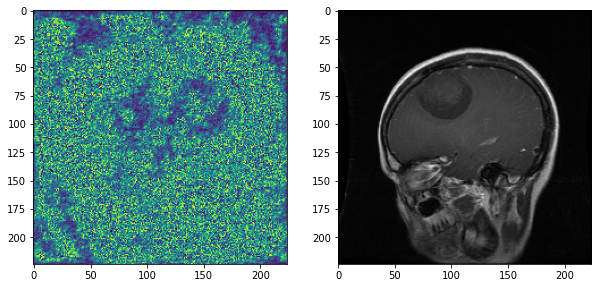

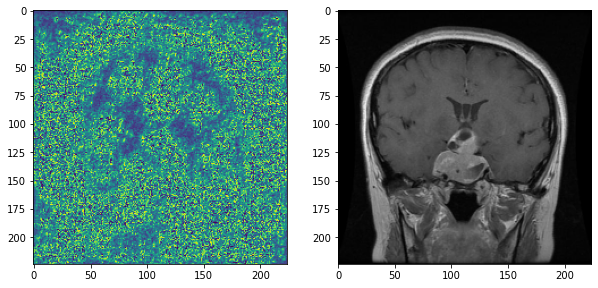

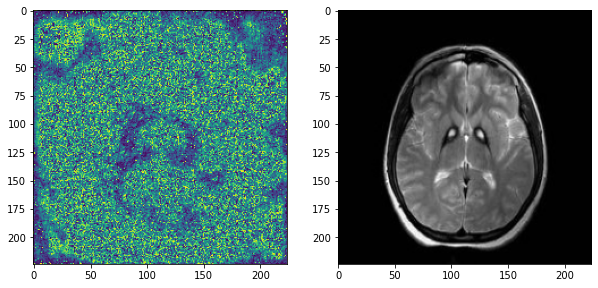

In [ ]:
gap_grid_m = smoothgrad.smoothgrad(image_m, 2, gap_model, 1)
gap_grid_g = smoothgrad.smoothgrad(image_g, 1, gap_model, 1)
gap_grid_p = smoothgrad.smoothgrad(image_p, 0, gap_model, 1)
gap_grid_n = smoothgrad.smoothgrad(image, 3, gap_model, 1)
gap_grid_m_1 = smoothgrad.smoothgrad(image_m_1, 2, gap_model, 1)
gap_grid_g_1 = smoothgrad.smoothgrad(image_g_1, 1, gap_model, 1)
gap_grid_p_1 = smoothgrad.smoothgrad(image_p_1, 0, gap_model, 1)
gap_grid_n_1 = smoothgrad.smoothgrad(image_1, 3, gap_model, 1)


Μέθοδος LIME

In [ ]:
gap_top_features_m, gap_num_superpixels_m, gap_superpixels_m, gap_img_m = lime.lime(image_m,gap_model)
gap_top_features_g, gap_num_superpixels_g, gap_superpixels_g,gap_img_g = lime.lime(image_g,gap_model)
gap_top_features_p, gap_num_superpixels_p, gap_superpixels_p,gap_img_p = lime.lime(image_p,gap_model)
gap_top_features_n, gap_num_superpixels_n, gap_superpixels_n,gap_img_n = lime.lime(image,gap_model)
gap_top_features_m_1, gap_num_superpixels_m_1, gap_superpixels_m_1,gap_img_m_1 = lime.lime(image_m_1,gap_model)
gap_top_features_g_1, gap_num_superpixels_g_1, gap_superpixels_g_1,gap_img_g_1 = lime.lime(image_g_1,gap_model)
gap_top_features_p_1, gap_num_superpixels_p_1, gap_superpixels_p_1,gap_img_p_1 =  lime.lime(image_p_1,gap_model)
gap_top_features_n_1, gap_num_superpixels_n_1, gap_superpixels_n_1,gap_img_n_1 = lime.lime(image_1,gap_model)

Αναπαράσταση των παραδειγμάτων για το 1o custom μοντέλο 

(0.0, 1.0, 0.0, 1.0)

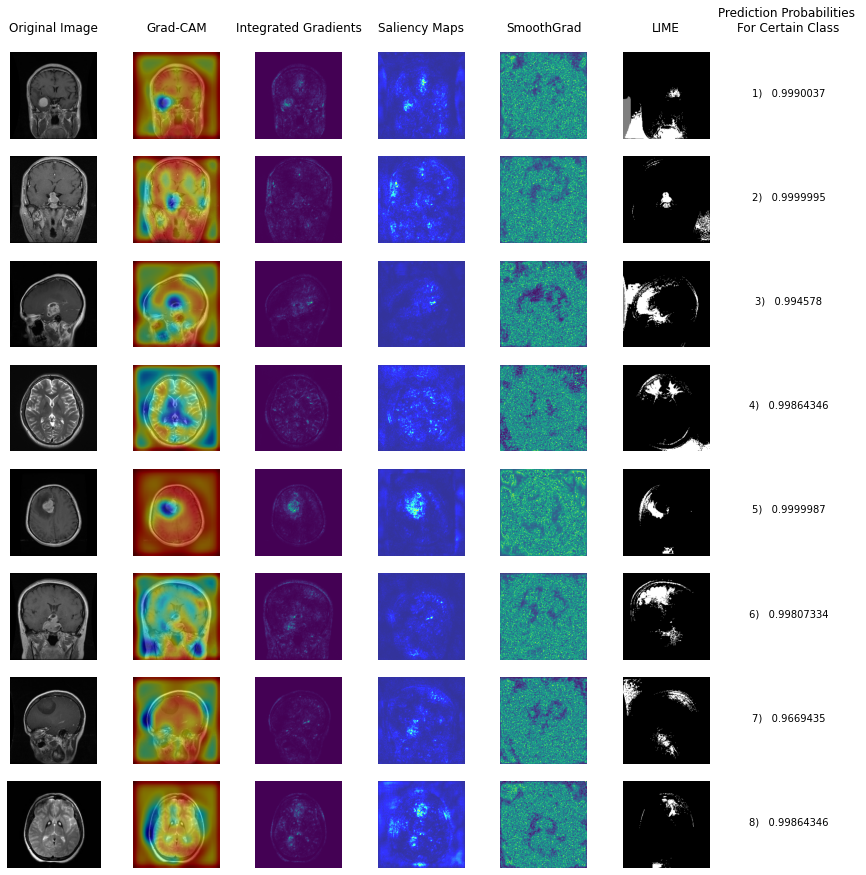

In [ ]:
fig, ax = plt.subplots(8,7,figsize=(15,15))

ax[0,0].set_title("Original Image\n")
ax[0,0].imshow(image_m)
ax[0,0].axis('off')
ax[1,0].imshow(image_p)
ax[1,0].axis('off')
ax[2,0].imshow(image_g)
ax[2,0].axis('off')
ax[3,0].imshow(image)
ax[3,0].axis('off')
ax[4,0].imshow(image_m_1)
ax[4,0].axis('off')
ax[5,0].imshow(image_p_1)
ax[5,0].axis('off')
ax[6,0].imshow(image_g_1)
ax[6,0].axis('off')
ax[7,0].imshow(image_1)
ax[7,0].axis('off')


ax[0,1].set_title("Grad-CAM\n")
ax[0,1].imshow(gap_output_m)
ax[0,1].axis('off')
ax[1,1].imshow(gap_output_p)
ax[1,1].axis('off')
ax[2,1].imshow(gap_output_g)
ax[2,1].axis('off')
ax[3,1].imshow(gap_output_n)
ax[3,1].axis('off')
ax[4,1].imshow(gap_output_m_1)
ax[4,1].axis('off')
ax[5,1].imshow(gap_output_p_1)
ax[5,1].axis('off')
ax[6,1].imshow(gap_output_g_1)
ax[6,1].axis('off')
ax[7,1].imshow(gap_output_n_1)
ax[7,1].axis('off')


ax[0,2].set_title("Integrated Gradients\n")
ax[0,2].imshow(gap_plot_m)
ax[0,2].axis('off')
ax[1,2].imshow(gap_plot_p)
ax[1,2].axis('off')
ax[2,2].imshow(gap_plot_g)
ax[2,2].axis('off')
ax[3,2].imshow(gap_plot_n)
ax[3,2].axis('off')
ax[4,2].imshow(gap_plot_m_1)
ax[4,2].axis('off')
ax[5,2].imshow(gap_plot_p_1)
ax[5,2].axis('off')
ax[6,2].imshow(gap_plot_g_1)
ax[6,2].axis('off')
ax[7,2].imshow(gap_plot_n_1)
ax[7,2].axis('off')

ax[0,3].set_title("Saliency Maps\n")
ax[0,3].imshow(gap_grad_eval_m,cmap="jet",alpha=0.8)
ax[0,3].axis('off')
ax[1,3].imshow(gap_grad_eval_p,cmap="jet",alpha=0.8)
ax[1,3].axis('off')
ax[2,3].imshow(gap_grad_eval_g,cmap="jet",alpha=0.8)
ax[2,3].axis('off')
ax[3,3].imshow(gap_grad_eval_n,cmap="jet",alpha=0.8)
ax[3,3].axis('off')
ax[4,3].imshow(gap_grad_eval_m_1,cmap="jet",alpha=0.8)
ax[4,3].axis('off')
ax[5,3].imshow(gap_grad_eval_g_1,cmap="jet",alpha=0.8)
ax[5,3].axis('off')
ax[6,3].imshow(gap_grad_eval_p_1,cmap="jet",alpha=0.8)
ax[6,3].axis('off')
ax[7,3].imshow(gap_grad_eval_n_1,cmap="jet",alpha=0.8)
ax[7,3].axis('off')

ax[0,4].set_title("SmoothGrad\n")
ax[0,4].imshow(gap_grid_m)
ax[0,4].axis('off')
ax[1,4].imshow(gap_grid_p)
ax[1,4].axis('off')
ax[2,4].imshow(gap_grid_g)
ax[2,4].axis('off')
ax[3,4].imshow(gap_grid_n)
ax[3,4].axis('off')
ax[4,4].imshow(gap_grid_m_1)
ax[4,4].axis('off')
ax[5,4].imshow(gap_grid_p_1)
ax[5,4].axis('off')
ax[6,4].imshow(gap_grid_g_1)
ax[6,4].axis('off')
ax[7,4].imshow(gap_grid_n_1)
ax[7,4].axis('off')

ax[0,5].set_title("LIME\n")
mask = np.zeros(gap_num_superpixels_m) 
mask[gap_top_features_m]= True #Activate top superpixels
ax[0,5].imshow(lime.perturb_image(gap_img_m/2+0.5,mask,gap_superpixels_m))
ax[0,5].axis('off')
mask = np.zeros(gap_num_superpixels_p) 
mask[gap_top_features_p]= True #Activate top superpixels
ax[1,5].imshow(lime.perturb_image(gap_img_p/2+0.5,mask,gap_superpixels_p))
ax[1,5].axis('off')
mask = np.zeros(gap_num_superpixels_g) 
mask[gap_top_features_g]= True #Activate top superpixels
ax[2,5].imshow(lime.perturb_image(gap_img_p/2+0.5,mask,gap_superpixels_g))
ax[2,5].axis('off')
mask = np.zeros(gap_num_superpixels_n) 
mask[gap_top_features_n]= True #Activate top superpixels
ax[3,5].imshow(lime.perturb_image(gap_img_n/2+0.5,mask,gap_superpixels_n))
ax[3,5].axis('off')
mask = np.zeros(gap_num_superpixels_m_1) 
mask[gap_top_features_m_1]= True #Activate top superpixels
ax[4,5].imshow(lime.perturb_image(gap_img_m_1/2+0.5,mask,gap_superpixels_m_1))
ax[4,5].axis('off')
amask = np.zeros(gap_num_superpixels_p_1) 
mask[gap_top_features_p_1]= True #Activate top superpixels
ax[5,5].imshow(lime.perturb_image(gap_img_p_1/2+0.5,mask,gap_superpixels_p_1))
ax[5,5].axis('off')
mask = np.zeros(gap_num_superpixels_g_1) 
mask[gap_top_features_g_1]= True #Activate top superpixels
ax[6,5].imshow(lime.perturb_image(gap_img_g_1/2+0.5,mask,gap_superpixels_g_1))
ax[6,5].axis('off')
mask = np.zeros(gap_num_superpixels_n_1) 
mask[gap_top_features_n_1]= True #Activate top superpixels
ax[7,5].imshow(lime.perturb_image(gap_img_n_1/2+0.5,mask,gap_superpixels_n_1))
ax[7,5].axis('off')

ax[0,6].set_title("Prediction Probabilities \nFor Certain Class\n")

ax[0,6].text(0.5, 0.5, str("1)   ")+ str(np.max(pred_m)), horizontalalignment='center');
ax[0,6].axis('off')
ax[1,6].text(0.5, 0.5,  str("2)   ")+ str(np.max(pred_p)), horizontalalignment='center');
ax[1,6].axis('off')
ax[2,6].text(0.5, 0.5,  str("3)   ")+ str(np.max(pred_g)), horizontalalignment='center');
ax[2,6].axis('off')
ax[3,6].text(0.5, 0.5,  str("4)   ")+ str(np.max(pred_n_1)), horizontalalignment='center');
ax[3,6].axis('off')
ax[4,6].text(0.5, 0.5,  str("5)   ")+ str(np.max(pred_m_1)), horizontalalignment='center');
ax[4,6].axis('off')
ax[5,6].text(0.5, 0.5,  str("6)   ")+ str(np.max(pred_p_1)), horizontalalignment='center');
ax[5,6].axis('off')
ax[6,6].text(0.5, 0.5,  str("7)   ")+ str(np.max(pred_g_1)), horizontalalignment='center');
ax[6,6].axis('off')
ax[7,6].text(0.5, 0.5,  str("8)   ")+ str(np.max(pred_n_1)), horizontalalignment='center');
ax[7,6].axis('off')

VGG16

In [ ]:
vgg_model = tf.keras.models.load_model('/content/drive/My Drive/MRI Classification/Multi_VGG16_1.h5')

In [ ]:
y = vgg_model.get_layer('dense_final').output
y = tf.math.scalar_mul(0.2, y)
y = layers.Activation("softmax")(y)

y_model_vgg = Model(inputs=vgg_model.input, outputs=y)

Προεπεξεργασία και πρόβλεψη για εικόνες

In [ ]:
vgg_ima_m = vgg_preprocess.gradcam_preprocess(image_m)
vgg_ima_g = vgg_preprocess.gradcam_preprocess(image_g)
vgg_ima_p = vgg_preprocess.gradcam_preprocess(image_p)
vgg_ima_n = vgg_preprocess.gradcam_preprocess(image)
vgg_ima_m_1 = vgg_preprocess.gradcam_preprocess(image_m_1)
vgg_ima_g_1 = vgg_preprocess.gradcam_preprocess(image_g_1)
vgg_ima_p_1 = vgg_preprocess.gradcam_preprocess(image_p_1)
vgg_ima_n_1 = vgg_preprocess.gradcam_preprocess(image_1)

In [ ]:
vgg_m, vgg_im_m, vgg_model_m = multi_predict.predict_image_efficientnet(vgg_ima_m,y_model_vgg)
vgg_g, vgg_im_g, vgg_model_g = multi_predict.predict_image_efficientnet(vgg_ima_g,y_model_vgg)
vgg_p, vgg_im_p, vgg_model_p = multi_predict.predict_image_efficientnet(vgg_ima_p,y_model_vgg)
vgg_n, vgg_im_n, vgg_model_n = multi_predict.predict_image_efficientnet(vgg_ima_n,y_model_vgg)

vgg_m_1, vgg_im_m_1, vgg_model_m_1 = multi_predict.predict_image_efficientnet(vgg_ima_m_1,y_model_vgg)
vgg_g_1, vgg_im_g_1, vgg_model_g_1 = multi_predict.predict_image_efficientnet(vgg_ima_g_1,y_model_vgg)
vgg_p_1, vgg_im_p_1, vgg_model_p_1= multi_predict.predict_image_efficientnet(vgg_ima_p_1,y_model_vgg)
vgg_n_1, vgg_im_n_1, vgg_model_n_1 = multi_predict.predict_image_efficientnet(vgg_ima_n_1,y_model_vgg)

meningioma tumor
[[1.6834838e-05 1.5897612e-01 8.4100699e-01 8.3029647e-08]]
2
glioma tumor
[[1.21809025e-08 9.99999881e-01 9.84960451e-08 1.32685654e-10]]
1
pituitary tumor
[[9.9990094e-01 1.6141104e-07 9.8915392e-05 1.8768145e-11]]
0
no tumor
[[2.87107421e-10 1.04152485e-11 1.89997951e-09 1.00000000e+00]]
3
meningioma tumor
[[8.4656149e-02 4.0523627e-01 5.0965685e-01 4.5073731e-04]]
2
glioma tumor
[[6.8097954e-08 9.9981958e-01 1.8032262e-04 2.5597018e-11]]
1
pituitary tumor
[[9.9997425e-01 8.7880556e-09 2.5708807e-05 1.5169669e-11]]
0
no tumor
[[4.8209301e-07 4.8040895e-04 1.6627159e-04 9.9935275e-01]]
3


Μέθοδος Grad-CAM

In [ ]:
vgg_heatmap_m, vgg_output_m = grad_cam.make_gradcam(vgg_m,vgg_im_m,image_m,vgg_model_m,'block5_conv3')
vgg_heatmap_g, vgg_output_g = grad_cam.make_gradcam(vgg_g,vgg_im_g,image_g, vgg_model_g,'block5_conv3')
vgg_heatmap_p, vgg_output_p = grad_cam.make_gradcam(vgg_p,vgg_im_p,image_p, vgg_model_p,'block5_conv3')
vgg_heatmap_n, vgg_output_n = grad_cam.make_gradcam(vgg_n,vgg_im_n,image, vgg_model_n,'block5_conv3')


vgg_heatmap_m_1, vgg_output_m_1 = grad_cam.make_gradcam(vgg_m_1,vgg_im_m_1,image_m_1, vgg_model_m_1,'block5_conv3')
vgg_heatmap_g_1, vgg_output_g_1 = grad_cam.make_gradcam(vgg_g_1,vgg_im_g_1,image_g_1, vgg_model_g_1,'block5_conv3')
vgg_heatmap_p_1, vgg_output_p_1 = grad_cam.make_gradcam(vgg_p_1,vgg_im_p_1,image_p_1, vgg_model_p_1,'block5_conv3')
vgg_heatmap_n_1, vgg_output_n_1 = grad_cam.make_gradcam(vgg_n_1,vgg_im_n_1,image_1, vgg_model_n_1,'block5_conv3')

(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)


Μέθοδος integrated gradients

In [ ]:
vgg_img_m = effnet_preprocess.preprocess_ig(image_m)
vgg_img_m = effnet_preprocess.preprocess_ig(image_m)
vgg_img_g = effnet_preprocess.preprocess_ig(image_g)
vgg_img_p = effnet_preprocess.preprocess_ig(image_p)
vgg_img = effnet_preprocess.preprocess_ig(image)
vgg_img_m_1 = effnet_preprocess.preprocess_ig(image_m_1)
vgg_img_g_1 = effnet_preprocess.preprocess_ig(image_g_1)
vgg_img_p_1 = effnet_preprocess.preprocess_ig(image_p_1)
vgg_img_1 = effnet_preprocess.preprocess_ig(image_1)

In [ ]:
vgg_interpolated_images_m = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_m, alphas=alphas)
vgg_interpolated_images_g = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_g, alphas=alphas)
vgg_interpolated_images_p = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_p, alphas=alphas)
vgg_interpolated_images_n = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img, alphas=alphas)
vgg_interpolated_images_m_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_m_1, alphas=alphas)
vgg_interpolated_images_g_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_g_1, alphas=alphas)
vgg_interpolated_images_p_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_p_1, alphas=alphas)
vgg_interpolated_images_n_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_1, alphas=alphas)


In [ ]:
vgg_path_gradients_m = ig_efficientnet.compute_gradients(images=vgg_interpolated_images_m, target_class_idx=vgg_m,model=vgg_model)
vgg_path_gradients_g = ig_efficientnet.compute_gradients(images=vgg_interpolated_images_g, target_class_idx=vgg_g,model=vgg_model)
vgg_path_gradients_p = ig_efficientnet.compute_gradients(images=vgg_interpolated_images_p, target_class_idx=vgg_p,model=vgg_model)
vgg_path_gradients_n = ig_efficientnet.compute_gradients(images=vgg_interpolated_images_n, target_class_idx=vgg_n,model=vgg_model)
vgg_path_gradients_m_1 = ig_efficientnet.compute_gradients(images=vgg_interpolated_images_m_1, target_class_idx=vgg_m_1,model=vgg_model)
vgg_path_gradients_g_1 = ig_efficientnet.compute_gradients(images=vgg_interpolated_images_g_1, target_class_idx=vgg_g_1,model=vgg_model)
vgg_path_gradients_p_1 = ig_efficientnet.compute_gradients(images=vgg_interpolated_images_p_1, target_class_idx=vgg_p_1,model=vgg_model)
vgg_path_gradients_n_1 = ig_efficientnet.compute_gradients(images=vgg_interpolated_images_n_1, target_class_idx=vgg_n_1,model=vgg_model)

In [ ]:
vgg_ig_m = ig_efficientnet.integral_approximation(gradients=vgg_path_gradients_m)
vgg_ig_g = ig_efficientnet.integral_approximation(gradients=vgg_path_gradients_g)
vgg_ig_p = ig_efficientnet.integral_approximation(gradients=vgg_path_gradients_p)
vgg_ig_n = ig_efficientnet.integral_approximation(gradients=vgg_path_gradients_n)
vgg_ig_m_1 = ig_efficientnet.integral_approximation(gradients=vgg_path_gradients_m_1)
vgg_ig_g_1 = ig_efficientnet.integral_approximation(gradients=vgg_path_gradients_g_1)
vgg_ig_p_1 = ig_efficientnet.integral_approximation(gradients=vgg_path_gradients_p_1)
vgg_ig_n_1 = ig_efficientnet.integral_approximation(gradients=vgg_path_gradients_n_1)



In [ ]:
vgg_mig_attributions_m = ig_efficientnet.integrated_gradients(baseline=baseline,image=vgg_img_m,target_class_idx=vgg_m,model=vgg_model, m_steps=240)
vgg_mig_attributions_g = ig_efficientnet.integrated_gradients(baseline=baseline,image=vgg_img_g,target_class_idx=vgg_g,model=vgg_model, m_steps=240)
vgg_mig_attributions_p = ig_efficientnet.integrated_gradients(baseline=baseline,image=vgg_img_p,target_class_idx=vgg_p,model=vgg_model, m_steps=240)
vgg_mig_attributions_n = ig_efficientnet.integrated_gradients(baseline=baseline,image=vgg_img,target_class_idx=vgg_n,model=vgg_model, m_steps=240)
vgg_mig_attributions_m_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=vgg_img_m_1,target_class_idx=vgg_m_1,model=vgg_model, m_steps=240)
vgg_mig_attributions_g_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=vgg_img_g_1,target_class_idx=vgg_g_1,model=vgg_model, m_steps=240)
vgg_mig_attributions_p_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=vgg_img_p_1,target_class_idx=vgg_p_1,model=vgg_model, m_steps=240)
vgg_mig_attributions_n_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=vgg_img_1,target_class_idx=vgg_n_1,model=vgg_model, m_steps=240)

In [ ]:
vgg_att_m, vgg_plot_m = ig_efficientnet.plot(image=vgg_img_m/255, baseline=baseline, target_class_idx=vgg_m,model=vgg_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_g, vgg_plot_g = ig_efficientnet.plot(image=vgg_img_g/255, baseline=baseline, target_class_idx=vgg_g,model=vgg_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_p, vgg_plot_p = ig_efficientnet.plot(image=vgg_img_p/255, baseline=baseline, target_class_idx=vgg_p,model=vgg_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_n, vgg_plot_n = ig_efficientnet.plot(image=vgg_img/255, baseline=baseline, target_class_idx=vgg_n,model=vgg_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_m_1, vgg_plot_m_1 = ig_efficientnet.plot(image=vgg_img_m_1/255, baseline=baseline, target_class_idx=vgg_m_1,model=vgg_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_g_1, vgg_plot_g_1 = ig_efficientnet.plot(image=vgg_img_g_1/255, baseline=baseline, target_class_idx=vgg_g_1,model=vgg_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_p_1, vgg_plot_p_1 =  ig_efficientnet.plot(image=vgg_img_p_1/255, baseline=baseline, target_class_idx=vgg_p_1,model=vgg_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_n_1, vgg_plot_n_1 = ig_efficientnet.plot(image=vgg_img_1/255, baseline=baseline, target_class_idx=vgg_n_1,model=vgg_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)

Saliency Maps


In [ ]:
vgg_simage_m = vgg_preprocess.preprocess_saliency(image_m)
vgg_simage_g = vgg_preprocess.preprocess_saliency(image_g)
vgg_simage_p = vgg_preprocess.preprocess_saliency(image_p)
vgg_simage_n = vgg_preprocess.preprocess_saliency(image)
vgg_simage_m_1 = vgg_preprocess.preprocess_saliency(image_m_1)
vgg_simage_g_1 = vgg_preprocess.preprocess_saliency(image_g_1)
vgg_simage_p_1 = vgg_preprocess.preprocess_saliency(image_p_1)
vgg_simage_n_1 = vgg_preprocess.preprocess_saliency(image_1)

In [ ]:
vgg_grads_m = saliency.saliency_preproccess(vgg_simage_m, y_model_vgg)
vgg_grads_g =  saliency.saliency_preproccess(vgg_simage_g, y_model_vgg)
vgg_grads_p =  saliency.saliency_preproccess(vgg_simage_p, y_model_vgg)
vgg_grads_n =  saliency.saliency_preproccess(vgg_simage_n, y_model_vgg)
vgg_grads_m_1 =  saliency.saliency_preproccess(vgg_simage_m_1, y_model_vgg)
vgg_grads_g_1 =  saliency.saliency_preproccess(vgg_simage_g_1, y_model_vgg)
vgg_grads_p_1 =  saliency.saliency_preproccess(vgg_simage_p_1, y_model_vgg)
vgg_grads_n_1 =  saliency.saliency_preproccess(vgg_simage_n_1, y_model_vgg)

In [ ]:
vgg_grad_eval_m = saliency.make_saliency(vgg_grads_m)
vgg_grad_eval_g = saliency.make_saliency(vgg_grads_g)
vgg_grad_eval_p = saliency.make_saliency(vgg_grads_p)
vgg_grad_eval_n = saliency.make_saliency(vgg_grads_n)
vgg_grad_eval_m_1 = saliency.make_saliency(vgg_grads_m_1)
vgg_grad_eval_g_1 = saliency.make_saliency(vgg_grads_g_1)
vgg_grad_eval_p_1 = saliency.make_saliency(vgg_grads_p_1)
vgg_grad_eval_n_1 = saliency.make_saliency(vgg_grads_n_1)

Μέθοδος Smoothgrad

In [ ]:
vgg_grid_m = smoothgrad.smoothgrad(image_m, 2, y_model_vgg, 0.025)
vgg_grid_g = smoothgrad.smoothgrad(image_g, 1, y_model_vgg, 1)
vgg_grid_p = smoothgrad.smoothgrad(image_p, 0, y_model_vgg, 1)
vgg_grid_n = smoothgrad.smoothgrad(image, 3, y_model_vgg, 0.5)
vgg_grid_m_1 = smoothgrad.smoothgrad(image_m_1, 2, y_model_vgg, 1)
vgg_grid_g_1 = smoothgrad.smoothgrad(image_g_1, 1, y_model_vgg, 1)
vgg_grid_p_1 = smoothgrad.smoothgrad(image_p_1, 0, y_model_vgg, 1)
vgg_grid_n_1 = smoothgrad.smoothgrad(image_1, 3, y_model_vgg, 1)


Μέθοδος LIME

In [ ]:
vgg_top_features_m, vgg_num_superpixels_m, vgg_superpixels_m, vgg_img_m = lime.lime(image_m,vgg_model)
vgg_top_features_g, vgg_num_superpixels_g, vgg_superpixels_g,vgg_img_g = lime.lime(image_g,vgg_model)
vgg_top_features_p, vgg_num_superpixels_p, vgg_superpixels_p,vgg_img_p = lime.lime(image_p,vgg_model)
vgg_top_features_n, vgg_num_superpixels_n, vgg_superpixels_n,vgg_img_n = lime.lime(image,vgg_model)
vgg_top_features_m_1, vgg_num_superpixels_m_1, vgg_superpixels_m_1,vgg_img_m_1 = lime.lime(image_m_1,vgg_model)
vgg_top_features_g_1, vgg_num_superpixels_g_1, vgg_superpixels_g_1,vgg_img_g_1 = lime.lime(image_g_1,vgg_model)
vgg_top_features_p_1, vgg_num_superpixels_p_1, vgg_superpixels_p_1,vgg_img_p_1 =  lime.lime(image_p_1,vgg_model)
vgg_top_features_n_1, vgg_num_superpixels_n_1, vgg_superpixels_n_1,vgg_img_n_1 = lime.lime(image_1,vgg_model)

Αναπαράσταση αποτελεσμάτων με το VGG16

(-0.5, 223.5, 223.5, -0.5)

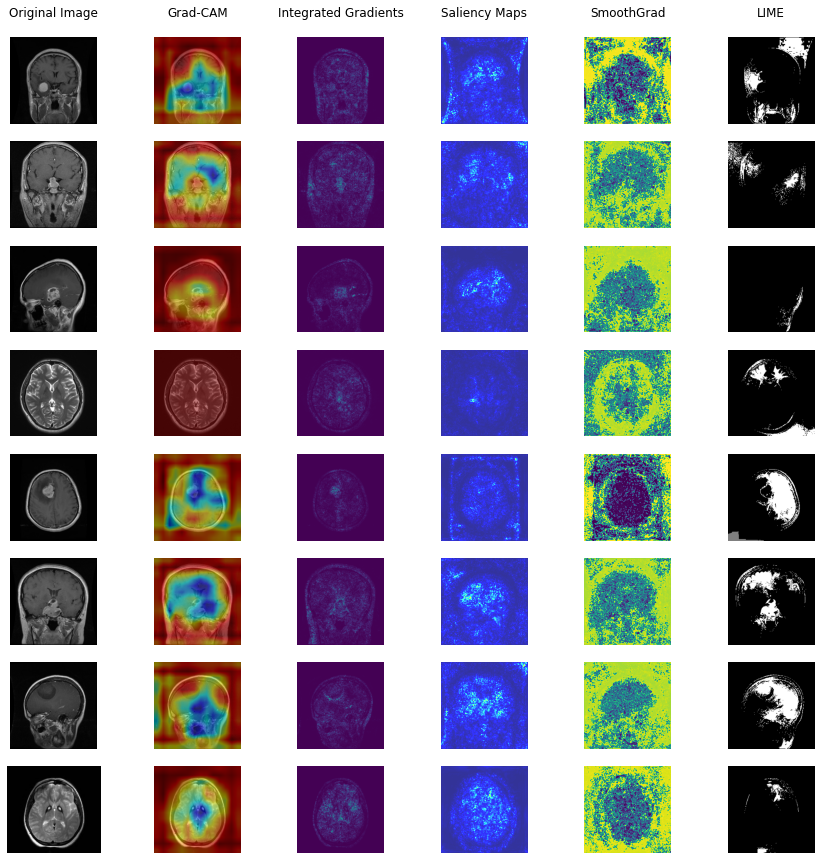

In [ ]:
fig, ax = plt.subplots(8,6,figsize=(15,15))

ax[0,0].set_title("Original Image\n")
ax[0,0].imshow(image_m)
ax[0,0].axis('off')
ax[0,0].set_ylabel("Meningioma")
# ax[0,0].set_title("Meningioma Tumor")
ax[1,0].imshow(image_p)
ax[1,0].axis('off')
ax[2,0].imshow(image_g)
ax[2,0].axis('off')
ax[3,0].imshow(image)
ax[3,0].axis('off')
ax[4,0].imshow(image_m_1)
ax[4,0].axis('off')
ax[5,0].imshow(image_p_1)
ax[5,0].axis('off')
ax[6,0].imshow(image_g_1)
ax[6,0].axis('off')
ax[7,0].imshow(image_1)
ax[7,0].axis('off')


ax[0,1].set_title("Grad-CAM\n")
ax[0,1].imshow(vgg_output_m)
ax[0,1].axis('off')
ax[1,1].imshow(vgg_output_p)
ax[1,1].axis('off')
ax[2,1].imshow(vgg_output_g)
ax[2,1].axis('off')
ax[3,1].imshow(vgg_output_n)
ax[3,1].axis('off')
ax[4,1].imshow(vgg_output_m_1)
ax[4,1].axis('off')
ax[5,1].imshow(vgg_output_p_1)
ax[5,1].axis('off')
ax[6,1].imshow(vgg_output_g_1)
ax[6,1].axis('off')
ax[7,1].imshow(vgg_output_n_1)
ax[7,1].axis('off')


ax[0,2].set_title("Integrated Gradients\n")
ax[0,2].imshow(vgg_plot_m)
ax[0,2].axis('off')
ax[1,2].imshow(vgg_plot_p)
ax[1,2].axis('off')
ax[2,2].imshow(vgg_plot_g)
ax[2,2].axis('off')
ax[3,2].imshow(vgg_plot_n)
ax[3,2].axis('off')
ax[4,2].imshow(vgg_plot_m_1)
ax[4,2].axis('off')
ax[5,2].imshow(vgg_plot_p_1)
ax[5,2].axis('off')
ax[6,2].imshow(vgg_plot_g_1)
ax[6,2].axis('off')
ax[7,2].imshow(vgg_plot_n_1)
ax[7,2].axis('off')

ax[0,3].set_title("Saliency Maps\n")
ax[0,3].imshow(vgg_grad_eval_m,cmap="jet",alpha=0.8)
ax[0,3].axis('off')
ax[1,3].imshow(vgg_grad_eval_p,cmap="jet",alpha=0.8)
ax[1,3].axis('off')
ax[2,3].imshow(vgg_grad_eval_g,cmap="jet",alpha=0.8)
ax[2,3].axis('off')
ax[3,3].imshow(vgg_grad_eval_n,cmap="jet",alpha=0.8)
ax[3,3].axis('off')
ax[4,3].imshow(vgg_grad_eval_m_1,cmap="jet",alpha=0.8)
ax[4,3].axis('off')
ax[5,3].imshow(vgg_grad_eval_g_1,cmap="jet",alpha=0.8)
ax[5,3].axis('off')
ax[6,3].imshow(vgg_grad_eval_p_1,cmap="jet",alpha=0.8)
ax[6,3].axis('off')
ax[7,3].imshow(vgg_grad_eval_n_1,cmap="jet",alpha=0.8)
ax[7,3].axis('off')

ax[0,4].set_title("SmoothGrad\n")
ax[0,4].imshow(vgg_grid_m)
ax[0,4].axis('off')
ax[1,4].imshow(vgg_grid_p)
ax[1,4].axis('off')
ax[2,4].imshow(vgg_grid_g)
ax[2,4].axis('off')
ax[3,4].imshow(vgg_grid_n)
ax[3,4].axis('off')
ax[4,4].imshow(vgg_grid_m_1)
ax[4,4].axis('off')
ax[5,4].imshow(vgg_grid_p_1)
ax[5,4].axis('off')
ax[6,4].imshow(vgg_grid_g_1)
ax[6,4].axis('off')
ax[7,4].imshow(vgg_grid_n_1)
ax[7,4].axis('off')

ax[0,5].set_title("LIME\n")
mask = np.zeros(vgg_num_superpixels_m) 
mask[vgg_top_features_m]= True #Activate top superpixels
ax[0,5].imshow(lime.perturb_image(vgg_img_m/2+0.5,mask,vgg_superpixels_m))
ax[0,5].axis('off')
mask = np.zeros(vgg_num_superpixels_p) 
mask[vgg_top_features_p]= True #Activate top superpixels
ax[1,5].imshow(lime.perturb_image(vgg_img_p/2+0.5,mask,vgg_superpixels_p))
ax[1,5].axis('off')
mask = np.zeros(vgg_num_superpixels_g) 
mask[vgg_top_features_g]= True #Activate top superpixels
ax[2,5].imshow(lime.perturb_image(vgg_img_p/2+0.5,mask,vgg_superpixels_g))
ax[2,5].axis('off')
mask = np.zeros(vgg_num_superpixels_n) 
mask[vgg_top_features_n]= True #Activate top superpixels
ax[3,5].imshow(lime.perturb_image(vgg_img_n/2+0.5,mask,vgg_superpixels_n))
ax[3,5].axis('off')
mask = np.zeros(vgg_num_superpixels_m_1) 
mask[vgg_top_features_m_1]= True #Activate top superpixels
ax[4,5].imshow(lime.perturb_image(vgg_img_m_1/2+0.5,mask,vgg_superpixels_m_1))
ax[4,5].axis('off')
amask = np.zeros(vgg_num_superpixels_p_1) 
mask[vgg_top_features_p_1]= True #Activate top superpixels
ax[5,5].imshow(lime.perturb_image(vgg_img_p_1/2+0.5,mask,vgg_superpixels_p_1))
ax[5,5].axis('off')
mask = np.zeros(vgg_num_superpixels_g_1) 
mask[vgg_top_features_g_1]= True #Activate top superpixels
ax[6,5].imshow(lime.perturb_image(vgg_img_g_1/2+0.5,mask,vgg_superpixels_g_1))
ax[6,5].axis('off')
mask = np.zeros(vgg_num_superpixels_n_1) 
mask[vgg_top_features_n_1]= True #Activate top superpixels
ax[7,5].imshow(lime.perturb_image(vgg_img_n_1/2+0.5,mask,vgg_superpixels_n_1))
ax[7,5].axis('off')

2ο custom μοντέλο

In [ ]:
nogap_model = tf.keras.models.load_model('/content/drive/My Drive/MRI Classification//No_gap_multi.h5')

Προεπεξεργασία και πρόβλεψη εικόνων

In [ ]:
nogap_ima_m = gap_preprocess.gradcam_preprocess(image_m)
nogap_ima_g = gap_preprocess.gradcam_preprocess(image_g)
nogap_ima_p = gap_preprocess.gradcam_preprocess(image_p)
nogap_ima_n = gap_preprocess.gradcam_preprocess(image)
nogap_ima_m_1 = gap_preprocess.gradcam_preprocess(image_m_1)
nogap_ima_g_1 = gap_preprocess.gradcam_preprocess(image_g_1)
nogap_ima_p_1 = gap_preprocess.gradcam_preprocess(image_p_1)
nogap_ima_n_1 = gap_preprocess.gradcam_preprocess(image_1)

In [ ]:
nogap_m, nogap_im_m, nogap_model_m, nopred_m = multi_predict.predict_image_efficientnet(nogap_ima_m,nogap_model)
nogap_g, nogap_im_g, nogap_model_g,nopred_g = multi_predict.predict_image_efficientnet(nogap_ima_g,nogap_model)
nogap_p, nogap_im_p, nogap_model_p,nopred_p = multi_predict.predict_image_efficientnet(nogap_ima_p,nogap_model)
nogap_n, nogap_im_n, nogap_model_n,nopred_n = multi_predict.predict_image_efficientnet(nogap_ima_n,nogap_model)

nogap_m_1, nogap_im_m_1, nogap_model_m_1,nopred_m_1 = multi_predict.predict_image_efficientnet(nogap_ima_m_1,nogap_model)
nogap_g_1, nogap_im_g_1, nogap_model_g_1,nopred_g_1 = multi_predict.predict_image_efficientnet(nogap_ima_g_1,nogap_model)
nogap_p_1, nogap_im_p_1, nogap_model_p_1,nopred_p_1= multi_predict.predict_image_efficientnet(nogap_ima_p_1,nogap_model)
nogap_n_1, nogap_im_n_1, nogap_model_n_1,nopred_n_1 = multi_predict.predict_image_efficientnet(nogap_ima_n_1,nogap_model)

meningioma tumor
[[3.7918999e-03 3.1279925e-02 9.6453208e-01 3.9608177e-04]]
2
glioma tumor
[[4.0966796e-07 9.9934536e-01 6.5350742e-04 7.3065905e-07]]
1
pituitary tumor
[[0.9789226  0.0052788  0.01432107 0.00147752]]
0
no tumor
[[6.5114866e-05 2.5573786e-04 2.8560625e-04 9.9939358e-01]]
3
meningioma tumor
[[4.8090890e-03 2.5379967e-02 9.6964407e-01 1.6690235e-04]]
2
glioma tumor
[[1.4553464e-05 9.4731426e-01 5.2435439e-02 2.3573982e-04]]
1
pituitary tumor
[[9.955391e-01 2.469186e-04 4.130352e-03 8.356403e-05]]
0
no tumor
[[1.28070005e-05 1.78699824e-03 2.10214849e-03 9.96098042e-01]]
3


Μέθοδος Grad-CAM

In [ ]:
nogap_heatmap_m, nogap_output_m = grad_cam.make_gradcam(nogap_m,nogap_im_m,image_m,nogap_model_m,'conv2d_10')
nogap_heatmap_g, nogap_output_g = grad_cam.make_gradcam(nogap_g,nogap_im_g,image_g, nogap_model_g,'conv2d_10')
nogap_heatmap_p, nogap_output_p = grad_cam.make_gradcam(nogap_p,nogap_im_p,image_p, nogap_model_p,'conv2d_10')
nogap_heatmap_n, nogap_output_n = grad_cam.make_gradcam(nogap_n,nogap_im_n,image, nogap_model_n,'conv2d_10')


nogap_heatmap_m_1, nogap_output_m_1 = grad_cam.make_gradcam(nogap_m_1,nogap_im_m_1,image_m_1, nogap_model_m_1,'conv2d_10')
nogap_heatmap_g_1, nogap_output_g_1 = grad_cam.make_gradcam(nogap_g_1,nogap_im_g_1,image_g_1, nogap_model_g_1,'conv2d_10')
nogap_heatmap_p_1, nogap_output_p_1 = grad_cam.make_gradcam(nogap_p_1,nogap_im_p_1,image_p_1, nogap_model_p_1,'conv2d_10')
nogap_heatmap_n_1, nogap_output_n_1 = grad_cam.make_gradcam(nogap_n_1,nogap_im_n_1,image_1, nogap_model_n_1,'conv2d_10')

(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)


Μέθοδος Integrated Gradients

In [ ]:
nogap_img_m = gap_preprocess.preprocess_ig(image_m)
nogap_img_m = gap_preprocess.preprocess_ig(image_m)
nogap_img_g = gap_preprocess.preprocess_ig(image_g)
nogap_img_p = gap_preprocess.preprocess_ig(image_p)
nogap_img = gap_preprocess.preprocess_ig(image)
nogap_img_m_1 = gap_preprocess.preprocess_ig(image_m_1)
nogap_img_g_1 = gap_preprocess.preprocess_ig(image_g_1)
nogap_img_p_1 = gap_preprocess.preprocess_ig(image_p_1)
nogap_img_1 = gap_preprocess.preprocess_ig(image_1)

In [ ]:
nogap_interpolated_images_m = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_m, alphas=alphas)
nogap_interpolated_images_g = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_g, alphas=alphas)
nogap_interpolated_images_p = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_p, alphas=alphas)
nogap_interpolated_images_n = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img, alphas=alphas)
nogap_interpolated_images_m_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_m_1, alphas=alphas)
nogap_interpolated_images_g_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_g_1, alphas=alphas)
nogap_interpolated_images_p_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_p_1, alphas=alphas)
nogap_interpolated_images_n_1 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_1, alphas=alphas)


In [ ]:
nogap_path_gradients_m = ig_efficientnet.compute_gradients(images=nogap_interpolated_images_m, target_class_idx=nogap_m,model=nogap_model)
nogap_path_gradients_g = ig_efficientnet.compute_gradients(images=nogap_interpolated_images_g, target_class_idx=nogap_g,model=nogap_model)
nogap_path_gradients_p = ig_efficientnet.compute_gradients(images=nogap_interpolated_images_p, target_class_idx=nogap_p,model=nogap_model)
nogap_path_gradients_n = ig_efficientnet.compute_gradients(images=nogap_interpolated_images_n, target_class_idx=nogap_n,model=nogap_model)
nogap_path_gradients_m_1 = ig_efficientnet.compute_gradients(images=nogap_interpolated_images_m_1, target_class_idx=nogap_m_1,model=nogap_model)
nogap_path_gradients_g_1 = ig_efficientnet.compute_gradients(images=nogap_interpolated_images_g_1, target_class_idx=nogap_g_1,model=nogap_model)
nogap_path_gradients_p_1 = ig_efficientnet.compute_gradients(images=nogap_interpolated_images_p_1, target_class_idx=nogap_p_1,model=nogap_model)
nogap_path_gradients_n_1 = ig_efficientnet.compute_gradients(images=nogap_interpolated_images_n_1, target_class_idx=nogap_n_1,model=nogap_model)

In [ ]:
nogap_ig_m = ig_efficientnet.integral_approximation(gradients=nogap_path_gradients_m)
nogap_ig_g = ig_efficientnet.integral_approximation(gradients=nogap_path_gradients_g)
nogap_ig_p = ig_efficientnet.integral_approximation(gradients=nogap_path_gradients_p)
nogap_ig_n = ig_efficientnet.integral_approximation(gradients=nogap_path_gradients_n)
nogap_ig_m_1 = ig_efficientnet.integral_approximation(gradients=nogap_path_gradients_m_1)
nogap_ig_g_1 = ig_efficientnet.integral_approximation(gradients=nogap_path_gradients_g_1)
nogap_ig_p_1 = ig_efficientnet.integral_approximation(gradients=nogap_path_gradients_p_1)
nogap_ig_n_1 = ig_efficientnet.integral_approximation(gradients=nogap_path_gradients_n_1)



In [ ]:
nogap_mig_attributions_m = ig_efficientnet.integrated_gradients(baseline=baseline,image=nogap_img_m,target_class_idx=nogap_m,model=nogap_model, m_steps=240)
nogap_mig_attributions_g = ig_efficientnet.integrated_gradients(baseline=baseline,image=nogap_img_g,target_class_idx=nogap_g,model=nogap_model, m_steps=240)
nogap_mig_attributions_p = ig_efficientnet.integrated_gradients(baseline=baseline,image=nogap_img_p,target_class_idx=nogap_p,model=nogap_model, m_steps=240)
nogap_mig_attributions_n = ig_efficientnet.integrated_gradients(baseline=baseline,image=nogap_img,target_class_idx=nogap_n,model=nogap_model, m_steps=240)
nogap_mig_attributions_m_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=nogap_img_m_1,target_class_idx=nogap_m_1,model=nogap_model, m_steps=240)
nogap_mig_attributions_g_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=nogap_img_g_1,target_class_idx=nogap_g_1,model=nogap_model, m_steps=240)
nogap_mig_attributions_p_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=nogap_img_p_1,target_class_idx=nogap_p_1,model=nogap_model, m_steps=240)
nogap_mig_attributions_n_1 = ig_efficientnet.integrated_gradients(baseline=baseline,image=nogap_img_1,target_class_idx=nogap_n_1,model=nogap_model, m_steps=240)

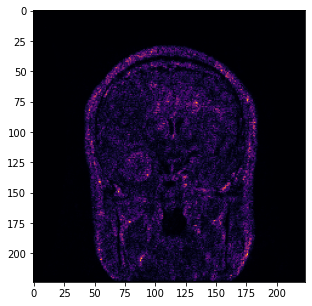

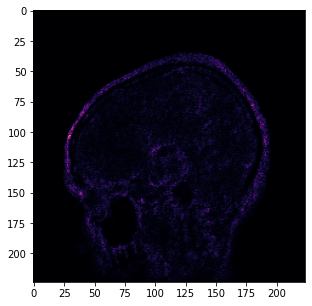

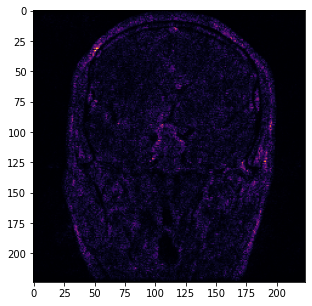

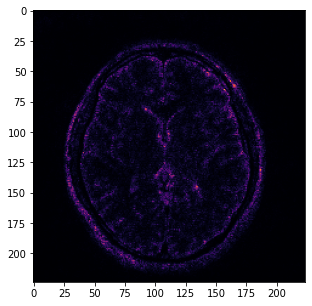

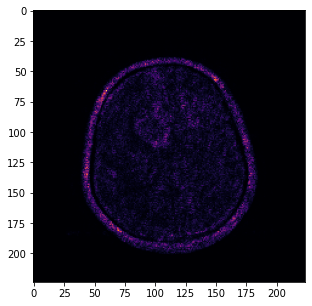

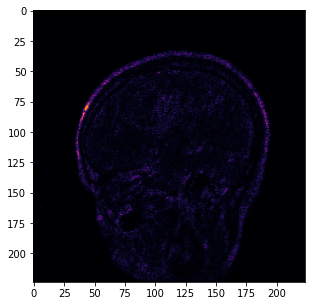

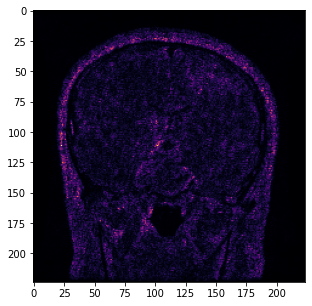

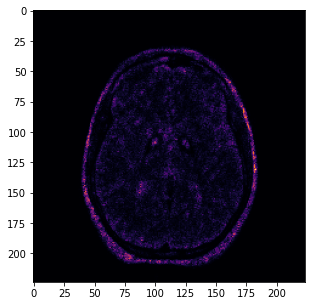

In [ ]:
nogap_att_m, nogap_plot_m = ig_efficientnet.plot(image=nogap_img_m/255, baseline=baseline, target_class_idx=nogap_m,model=nogap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_g, nogap_plot_g = ig_efficientnet.plot(image=nogap_img_g/255, baseline=baseline, target_class_idx=nogap_g,model=nogap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_p, nogap_plot_p = ig_efficientnet.plot(image=nogap_img_p/255, baseline=baseline, target_class_idx=nogap_p,model=nogap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_n, nogap_plot_n = ig_efficientnet.plot(image=nogap_img/255, baseline=baseline, target_class_idx=nogap_n,model=nogap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_m_1, nogap_plot_m_1 = ig_efficientnet.plot(image=nogap_img_m_1/255, baseline=baseline, target_class_idx=nogap_m_1,model=nogap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_g_1, nogap_plot_g_1 = ig_efficientnet.plot(image=nogap_img_g_1/255, baseline=baseline, target_class_idx=nogap_g_1,model=nogap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_p_1, nogap_plot_p_1 =  ig_efficientnet.plot(image=nogap_img_p_1/255, baseline=baseline, target_class_idx=nogap_p_1,model=nogap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_n_1, nogap_plot_n_1 = ig_efficientnet.plot(image=nogap_img_1/255, baseline=baseline, target_class_idx=nogap_n_1,model=nogap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)

Μέθοδος Saliency Maps

In [ ]:
nogap_simage_m = gap_preprocess.preprocess_saliency(image_m)
nogap_simage_g = gap_preprocess.preprocess_saliency(image_g)
nogap_simage_p = gap_preprocess.preprocess_saliency(image_p)
nogap_simage_n = gap_preprocess.preprocess_saliency(image)
nogap_simage_m_1 = gap_preprocess.preprocess_saliency(image_m_1)
nogap_simage_g_1 = gap_preprocess.preprocess_saliency(image_g_1)
nogap_simage_p_1 = gap_preprocess.preprocess_saliency(image_p_1)
nogap_simage_n_1 = gap_preprocess.preprocess_saliency(image_1)

In [ ]:
nogap_grads_m = saliency.saliency_preproccess(nogap_simage_m, nogap_model)
nogap_grads_g =  saliency.saliency_preproccess(nogap_simage_g, nogap_model)
nogap_grads_p =  saliency.saliency_preproccess(nogap_simage_p, nogap_model)
nogap_grads_n =  saliency.saliency_preproccess(nogap_simage_n, nogap_model)
nogap_grads_m_1 =  saliency.saliency_preproccess(nogap_simage_m_1, nogap_model)
nogap_grads_g_1 =  saliency.saliency_preproccess(nogap_simage_g_1, nogap_model)
nogap_grads_p_1 =  saliency.saliency_preproccess(nogap_simage_p_1, nogap_model)
nogap_grads_n_1 =  saliency.saliency_preproccess(nogap_simage_n_1, nogap_model)

In [ ]:
nogap_grad_eval_m = saliency.make_saliency(nogap_grads_m)
nogap_grad_eval_g = saliency.make_saliency(nogap_grads_g)
nogap_grad_eval_p = saliency.make_saliency(nogap_grads_p)
nogap_grad_eval_n = saliency.make_saliency(nogap_grads_n)
nogap_grad_eval_m_1 = saliency.make_saliency(nogap_grads_m_1)
nogap_grad_eval_g_1 = saliency.make_saliency(nogap_grads_g_1)
nogap_grad_eval_p_1 = saliency.make_saliency(nogap_grads_p_1)
nogap_grad_eval_n_1 = saliency.make_saliency(nogap_grads_n_1)

Μέθοδος Smoothgrad

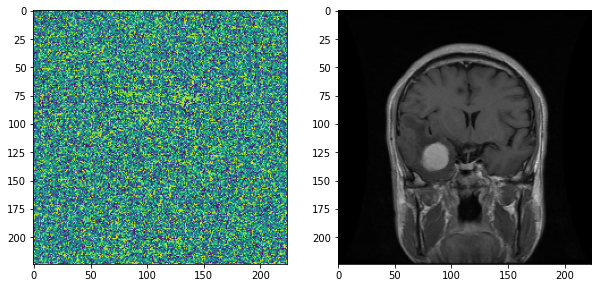

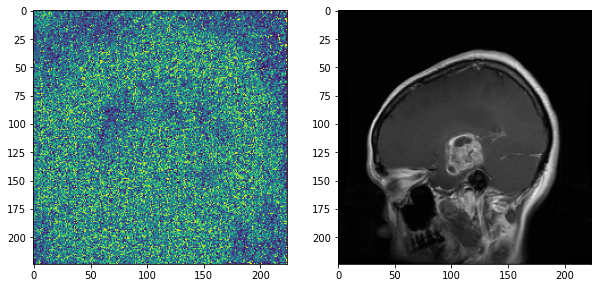

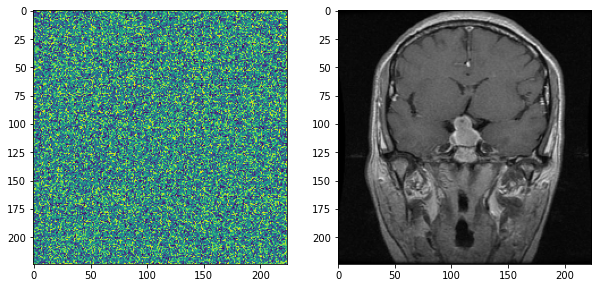

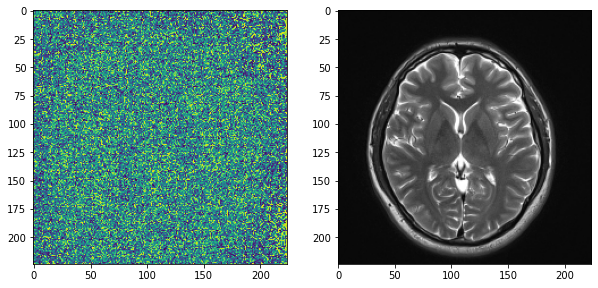

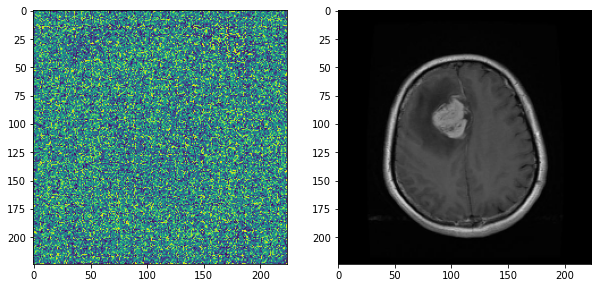

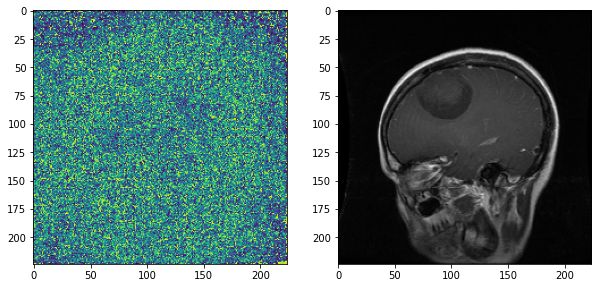

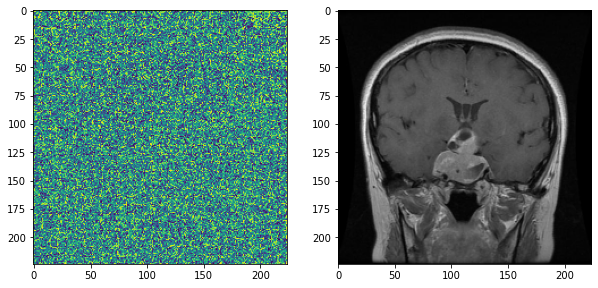

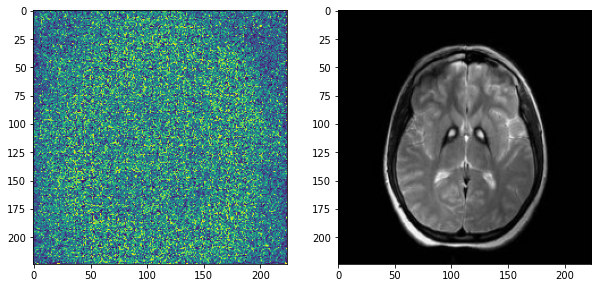

In [ ]:
nogap_grid_m = smoothgrad.smoothgrad(image_m, 2, nogap_model, 5)
nogap_grid_g = smoothgrad.smoothgrad(image_g, 1, nogap_model, 1)
nogap_grid_p = smoothgrad.smoothgrad(image_p, 0, nogap_model, 1)
nogap_grid_n = smoothgrad.smoothgrad(image, 3, nogap_model, 0.5)
nogap_grid_m_1 = smoothgrad.smoothgrad(image_m_1, 2, nogap_model, 1)
nogap_grid_g_1 = smoothgrad.smoothgrad(image_g_1, 1, nogap_model, 1)
nogap_grid_p_1 = smoothgrad.smoothgrad(image_p_1, 0, nogap_model, 1)
nogap_grid_n_1 = smoothgrad.smoothgrad(image_1, 3, nogap_model, 1)


Μέθοδος LIME

In [ ]:
nogap_top_features_m, nogap_num_superpixels_m, nogap_superpixels_m, nogap_img_m = lime.lime(image_m,nogap_model)
nogap_top_features_g, nogap_num_superpixels_g, nogap_superpixels_g,nogap_img_g = lime.lime(image_g,nogap_model)
nogap_top_features_p, nogap_num_superpixels_p, nogap_superpixels_p,nogap_img_p = lime.lime(image_p,nogap_model)
nogap_top_features_n, nogap_num_superpixels_n, nogap_superpixels_n,nogap_img_n = lime.lime(image,nogap_model)
nogap_top_features_m_1, nogap_num_superpixels_m_1, nogap_superpixels_m_1,nogap_img_m_1 = lime.lime(image_m_1,nogap_model)
nogap_top_features_g_1, nogap_num_superpixels_g_1, nogap_superpixels_g_1,nogap_img_g_1 = lime.lime(image_g_1,nogap_model)
nogap_top_features_p_1, nogap_num_superpixels_p_1, nogap_superpixels_p_1,nogap_img_p_1 =  lime.lime(image_p_1,nogap_model)
nogap_top_features_n_1, nogap_num_superpixels_n_1, nogap_superpixels_n_1,nogap_img_n_1 = lime.lime(image_1,nogap_model)

Αναπαράσταση αποτελεσμάτων με το 2ο custom μοντέλο

(0.0, 1.0, 0.0, 1.0)

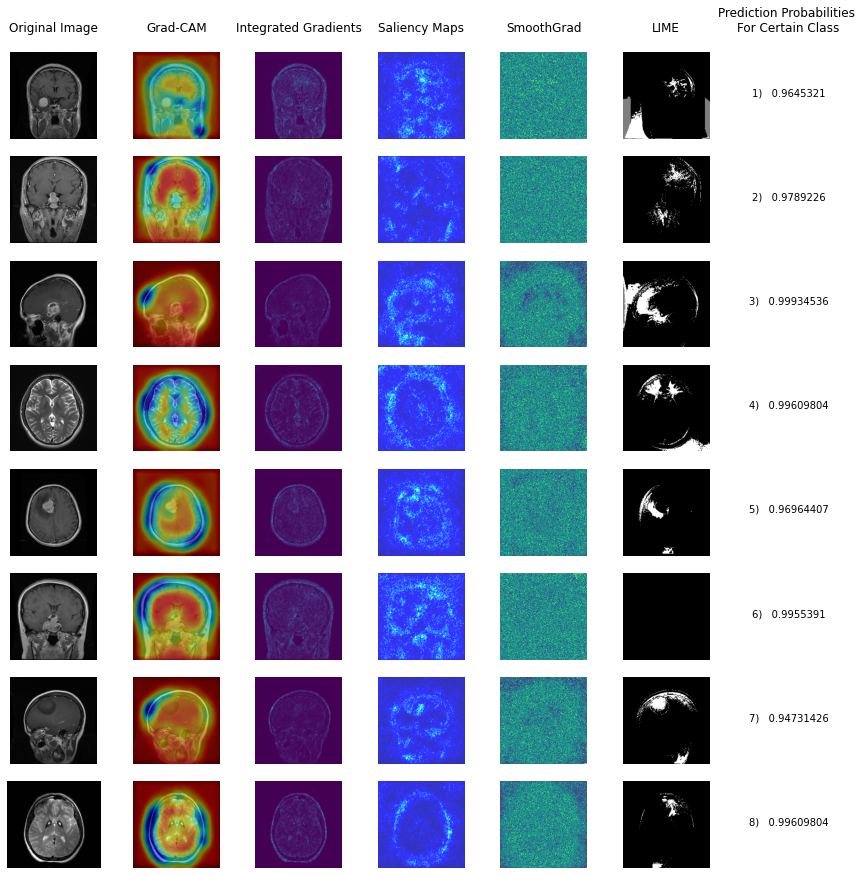

In [ ]:
fig, ax = plt.subplots(8,7,figsize=(15,15))

ax[0,0].set_title("Original Image\n")
ax[0,0].imshow(image_m)
ax[0,0].axis('off')
ax[0,0].set_ylabel("Meningioma")
# ax[0,0].set_title("Meningioma Tumor")
ax[1,0].imshow(image_p)
ax[1,0].axis('off')
ax[2,0].imshow(image_g)
ax[2,0].axis('off')
ax[3,0].imshow(image)
ax[3,0].axis('off')
ax[4,0].imshow(image_m_1)
ax[4,0].axis('off')
ax[5,0].imshow(image_p_1)
ax[5,0].axis('off')
ax[6,0].imshow(image_g_1)
ax[6,0].axis('off')
ax[7,0].imshow(image_1)
ax[7,0].axis('off')


ax[0,1].set_title("Grad-CAM\n")
ax[0,1].imshow(nogap_output_m)
ax[0,1].axis('off')
ax[1,1].imshow(nogap_output_p)
ax[1,1].axis('off')
ax[2,1].imshow(nogap_output_g)
ax[2,1].axis('off')
ax[3,1].imshow(nogap_output_n)
ax[3,1].axis('off')
ax[4,1].imshow(nogap_output_m_1)
ax[4,1].axis('off')
ax[5,1].imshow(nogap_output_p_1)
ax[5,1].axis('off')
ax[6,1].imshow(nogap_output_g_1)
ax[6,1].axis('off')
ax[7,1].imshow(nogap_output_n_1)
ax[7,1].axis('off')


ax[0,2].set_title("Integrated Gradients\n")
ax[0,2].imshow(nogap_plot_m)
ax[0,2].axis('off')
ax[1,2].imshow(nogap_plot_p)
ax[1,2].axis('off')
ax[2,2].imshow(nogap_plot_g)
ax[2,2].axis('off')
ax[3,2].imshow(nogap_plot_n)
ax[3,2].axis('off')
ax[4,2].imshow(nogap_plot_m_1)
ax[4,2].axis('off')
ax[5,2].imshow(nogap_plot_p_1)
ax[5,2].axis('off')
ax[6,2].imshow(nogap_plot_g_1)
ax[6,2].axis('off')
ax[7,2].imshow(nogap_plot_n_1)
ax[7,2].axis('off')

ax[0,3].set_title("Saliency Maps\n")
ax[0,3].imshow(nogap_grad_eval_m,cmap="jet",alpha=0.8)
ax[0,3].axis('off')
ax[1,3].imshow(nogap_grad_eval_p,cmap="jet",alpha=0.8)
ax[1,3].axis('off')
ax[2,3].imshow(nogap_grad_eval_g,cmap="jet",alpha=0.8)
ax[2,3].axis('off')
ax[3,3].imshow(nogap_grad_eval_n,cmap="jet",alpha=0.8)
ax[3,3].axis('off')
ax[4,3].imshow(nogap_grad_eval_m_1,cmap="jet",alpha=0.8)
ax[4,3].axis('off')
ax[5,3].imshow(nogap_grad_eval_p_1,cmap="jet",alpha=0.8)
ax[5,3].axis('off')
ax[6,3].imshow(nogap_grad_eval_g_1,cmap="jet",alpha=0.8)
ax[6,3].axis('off')
ax[7,3].imshow(nogap_grad_eval_n_1,cmap="jet",alpha=0.8)
ax[7,3].axis('off')

ax[0,4].set_title("SmoothGrad\n")
ax[0,4].imshow(nogap_grid_m)
ax[0,4].axis('off')
ax[1,4].imshow(nogap_grid_p)
ax[1,4].axis('off')
ax[2,4].imshow(nogap_grid_g)
ax[2,4].axis('off')
ax[3,4].imshow(nogap_grid_n)
ax[3,4].axis('off')
ax[4,4].imshow(nogap_grid_m_1)
ax[4,4].axis('off')
ax[5,4].imshow(nogap_grid_p_1)
ax[5,4].axis('off')
ax[6,4].imshow(nogap_grid_g_1)
ax[6,4].axis('off')
ax[7,4].imshow(nogap_grid_n_1)
ax[7,4].axis('off')

ax[0,5].set_title("LIME\n")
mask = np.zeros(nogap_num_superpixels_m) 
mask[nogap_top_features_m]= True #Activate top superpixels
ax[0,5].imshow(lime.perturb_image(nogap_img_m/2+0.5,mask,nogap_superpixels_m))
ax[0,5].axis('off')
mask = np.zeros(nogap_num_superpixels_p) 
mask[nogap_top_features_p]= True #Activate top superpixels
ax[1,5].imshow(lime.perturb_image(nogap_img_p/2+0.5,mask,nogap_superpixels_p))
ax[1,5].axis('off')
mask = np.zeros(nogap_num_superpixels_g) 
mask[nogap_top_features_g]= True #Activate top superpixels
ax[2,5].imshow(lime.perturb_image(nogap_img_p/2+0.5,mask,nogap_superpixels_g))
ax[2,5].axis('off')
mask = np.zeros(nogap_num_superpixels_n) 
mask[nogap_top_features_n]= True #Activate top superpixels
ax[3,5].imshow(lime.perturb_image(nogap_img_n/2+0.5,mask,nogap_superpixels_n))
ax[3,5].axis('off')
mask = np.zeros(nogap_num_superpixels_m_1) 
mask[nogap_top_features_m_1]= True #Activate top superpixels
ax[4,5].imshow(lime.perturb_image(nogap_img_m_1/2+0.5,mask,nogap_superpixels_m_1))
ax[4,5].axis('off')
# amask = np.zeros(nogap_num_superpixels_p_1) 
# mask[nogap_top_features_p_1]= True #Activate top superpixels
ax[5,5].imshow(baseline)
ax[5,5].axis('off')
mask = np.zeros(nogap_num_superpixels_g_1) 
mask[nogap_top_features_g_1]= True #Activate top superpixels
ax[6,5].imshow(lime.perturb_image(nogap_img_g_1/2+0.5,mask,nogap_superpixels_g_1))
ax[6,5].axis('off')
mask = np.zeros(nogap_num_superpixels_n_1) 
mask[nogap_top_features_n_1]= True #Activate top superpixels
ax[7,5].imshow(lime.perturb_image(nogap_img_n_1/2+0.5,mask,nogap_superpixels_n_1))
ax[7,5].axis('off')

ax[0,6].set_title("Prediction Probabilities \nFor Certain Class\n")
ax[0,6].text(0.5, 0.5, str("1)   ")+ str(np.max(nopred_m)), horizontalalignment='center');
ax[0,6].axis('off')
ax[1,6].text(0.5, 0.5,  str("2)   ")+ str(np.max(nopred_p)), horizontalalignment='center');
ax[1,6].axis('off')
ax[2,6].text(0.5, 0.5,  str("3)   ")+ str(np.max(nopred_g)), horizontalalignment='center');
ax[2,6].axis('off')
ax[3,6].text(0.5, 0.5,  str("4)   ")+ str(np.max(nopred_n_1)), horizontalalignment='center');
ax[3,6].axis('off')
ax[4,6].text(0.5, 0.5,  str("5)   ")+ str(np.max(nopred_m_1)), horizontalalignment='center');
ax[4,6].axis('off')
ax[5,6].text(0.5, 0.5,  str("6)   ")+ str(np.max(nopred_p_1)), horizontalalignment='center');
ax[5,6].axis('off')
ax[6,6].text(0.5, 0.5,  str("7)   ")+ str(np.max(nopred_g_1)), horizontalalignment='center');
ax[6,6].axis('off')
ax[7,6].text(0.5, 0.5,  str("8)   ")+ str(np.max(nopred_n_1)), horizontalalignment='center');
ax[7,6].axis('off')